## ENCM 509 Final Project (Face Detection and Recognition using OpenCV)
## Group 7
## Members: Ahmed Anwar, Ali Mekawy, Mohamed Mahmoud

In [2]:
import cv2
import matplotlib.pyplot as plt
from skimage.feature import local_binary_pattern
from sklearn.svm import SVC
import numpy as np
from sklearn.utils import shuffle
import os
from sklearn.model_selection import train_test_split
from sklearn.neural_network import MLPClassifier
import shutil
from sklearn.metrics import roc_curve, det_curve
from glob import glob
from sklearn.metrics import confusion_matrix
import seaborn as sns
import pandas as pd
from tensorflow.keras.preprocessing.image import ImageDataGenerator
import tensorflow as tf
from skimage import feature

## Visualizing the dataset

Found 40 classes: ['s1', 's10', 's11', 's12', 's13', 's14', 's15', 's16', 's17', 's18', 's19', 's2', 's20', 's21', 's22', 's23', 's24', 's25', 's26', 's27', 's28', 's29', 's3', 's30', 's31', 's32', 's33', 's34', 's35', 's36', 's37', 's38', 's39', 's4', 's40', 's5', 's6', 's7', 's8', 's9']


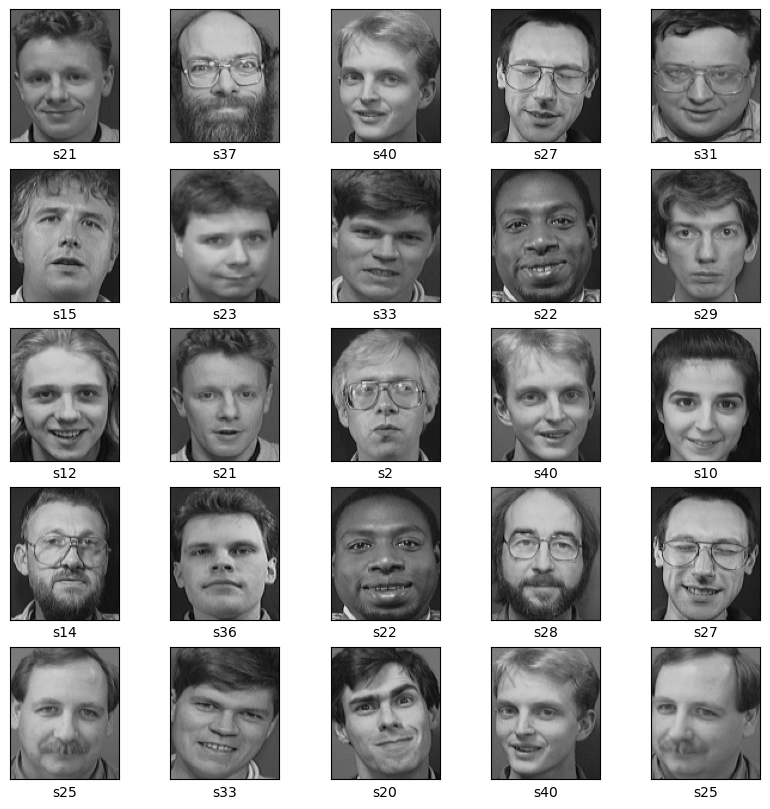

In [17]:
DATASET_PATH = 'ATT_dataset'

if not os.path.exists(DATASET_PATH):
    print('Dataset not found!')
    exit(1)

# Load dataset
classes = os.listdir(DATASET_PATH)
print('Found {} classes: {}'.format(len(classes), classes))

# Visualizing the images
images = []
labels = []
class_index = 0
for class_name in classes:
    class_path = os.path.join(DATASET_PATH, class_name)
    for image_name in os.listdir(class_path):
        image_path = os.path.join(class_path, image_name)
        image = cv2.imread(image_path)
        images.append(image)
        labels.append(class_index)
    class_index += 1
images = np.array(images)
labels = np.array(labels)

# Shuffle the dataset with scikit-learn
images, labels = shuffle(images, labels, random_state=0)

# Plot 25 random images from the dataset
plt.figure(figsize=(10, 10))
for i in range(25):
    plt.subplot(5, 5, i + 1)
    plt.xticks([])
    plt.yticks([])
    plt.grid(False)
    plt.imshow(images[i])
    plt.xlabel(classes[labels[i]])


# Splitting into training and testing datasets (5-fold cross validation)

In [215]:
# Define source directory and target directories
src_dir = 'ATT_dataset'

# Number of folds
num_folds = 5

# Create target directories if they don't exist
for i in range(1, num_folds+1):
    os.makedirs(f'train_dataset_{i}', exist_ok=True)
    os.makedirs(f'test_dataset_{i}', exist_ok=True)

# Get list of all subdirectories
subdirs = [d for d in os.listdir(src_dir) if os.path.isdir(os.path.join(src_dir, d))]

# Loop over each subdirectory
for subdir in subdirs:
    subdir_path = os.path.join(src_dir, subdir)
    images = os.listdir(subdir_path)
    
    # Shuffle the list of images
    np.random.shuffle(images)
    
    # Split the list of images into 5 folds
    images_folds = np.array_split(images, num_folds)

    # For each fold, assign it as testing set and the rest as training set
    for i in range(num_folds):
        train_images = np.concatenate([images_folds[j] for j in range(num_folds) if j != i]).tolist()
        test_images = images_folds[i].tolist()

        # Create corresponding subdirectories in the target directories
        os.makedirs(os.path.join(f'train_dataset_{i+1}', subdir), exist_ok=True)
        os.makedirs(os.path.join(f'test_dataset_{i+1}', subdir), exist_ok=True)
        
        # Copy the training images to the training directory
        for image in train_images:
            shutil.copy(os.path.join(subdir_path, image), os.path.join(f'train_dataset_{i+1}', subdir, image))
        
        # Copy the testing images to the testing directory
        for image in test_images:
            shutil.copy(os.path.join(subdir_path, image), os.path.join(f'test_dataset_{i+1}', subdir, image))

## Face detection visualization

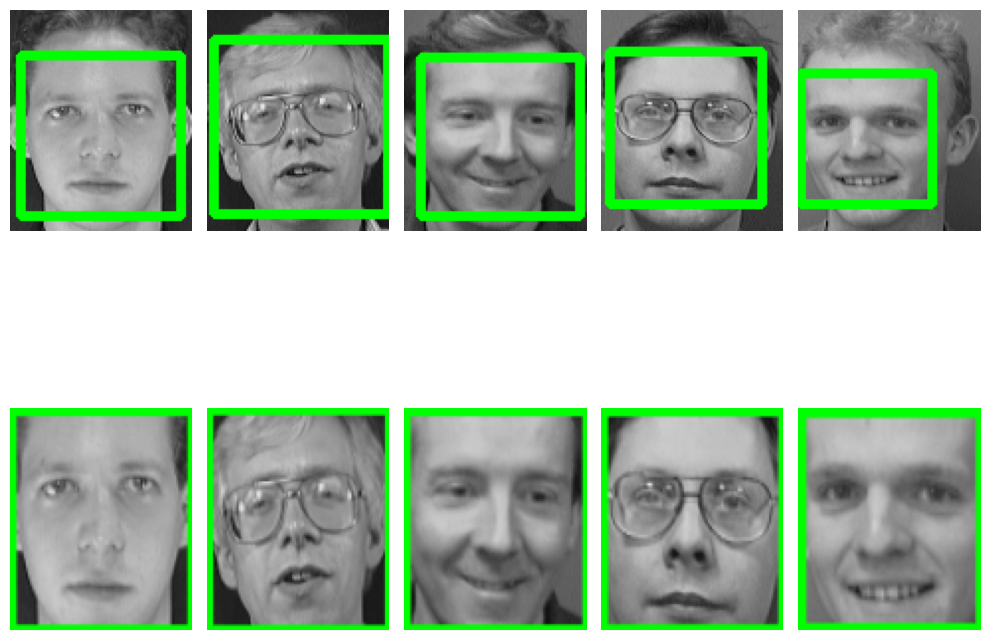

In [3]:
# Perform face detection on a few different subjects

# Load the images
images = []
cropped_faces = []
for i in range(1, 6):
    path = 'ATT_dataset/s{}/1.pgm'.format(i)
    img = cv2.imread(path)
    images.append(img)

# Perform face detection
face_cascade = cv2.CascadeClassifier('haarcascade_frontalface_default.xml')
for i in range(5):
    gray = cv2.cvtColor(images[i], cv2.COLOR_BGR2GRAY)
    face_box = face_cascade.detectMultiScale(gray, scaleFactor=1.1, minNeighbors=4)
    for (x, y, w, h) in face_box:
        cv2.rectangle(images[i], (x, y), (x+w, y+h), (0, 255, 0), 3)
        cropped_faces.append(images[i][y:y+h, x:x+w])
        cropped_faces[-1] = cv2.resize(cropped_faces[-1], (92, 112))

plt.figure(figsize=(10, 10))
for i in range(5):
    plt.subplot(2, 5, i + 1)
    plt.imshow(images[i])
    plt.axis('off')
    plt.subplot(2, 5, i + 6)
    
    plt.imshow(cropped_faces[i], cmap='gray')
    plt.axis('off')

plt.tight_layout()


## LBP feature extraction visualization

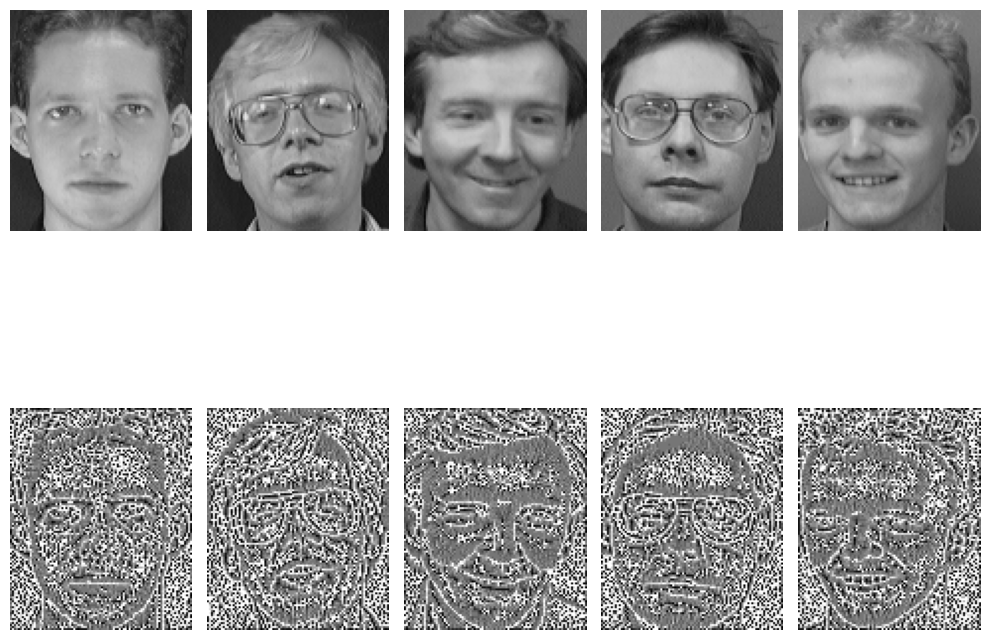

In [217]:
# Load the images
images = []
for i in range(1, 6):
    path = 'ATT_dataset/s{}/1.pgm'.format(i)
    img = cv2.imread(path)
    images.append(img)
    
# Perform LBP feature extraction
lbp_images = []
for img in images:
    gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
    lbp = local_binary_pattern(gray, 12, 1, 'uniform')
    lbp_images.append(lbp)

# Display the images
plt.figure(figsize=(10, 10))
for i in range(5):
    plt.subplot(2, 5, i + 1)
    plt.imshow(images[i])
    plt.axis('off')
    plt.subplot(2, 5, i + 6)
    plt.imshow(lbp_images[i], cmap='gray')
    plt.axis('off')

plt.tight_layout()

In [8]:
def get_data(path, p, r, m, bin):
    
    paths = glob(path, recursive=True)
    data = []
    label = []
    

    for path in paths:
        img = cv2.imread(path, 0)
        subject_label = path[path.rfind('s')+1:path.rfind('\\')]

        img = np.float32(np.array(img) / 255.0)

        # LBP feature extraction
        lbp = feature.local_binary_pattern(img, p, r, method=m)
        (hist, _) = np.histogram(lbp.ravel(), bins=bin, range=(0, bin))

        # normalize the histogram
        hist = hist.astype("float")

        data.append(hist)
        label.append(int(subject_label))

    return np.array(data), np.array(label)

## Getting best LBP parameters for SVM

c:\Users\alime\anaconda3\Lib\site-packages\skimage\feature\texture.py:353: UserWarning: Applying `local_binary_pattern` to floating-point images may give unexpected results when small numerical differences between adjacent pixels are present. It is recommended to use this function with images of integer dtype.
  warnings.warn(
c:\Users\alime\anaconda3\Lib\site-packages\skimage\feature\texture.py:353: UserWarning: Applying `local_binary_pattern` to floating-point images may give unexpected results when small numerical differences between adjacent pixels are present. It is recommended to use this function with images of integer dtype.
  warnings.warn(
c:\Users\alime\anaconda3\Lib\site-packages\skimage\feature\texture.py:353: UserWarning: Applying `local_binary_pattern` to floating-point images may give unexpected results when small numerical differences between adjacent pixels are present. It is recommended to use this function with images of integer dtype.
  warnings.warn(
c:\Users\alim

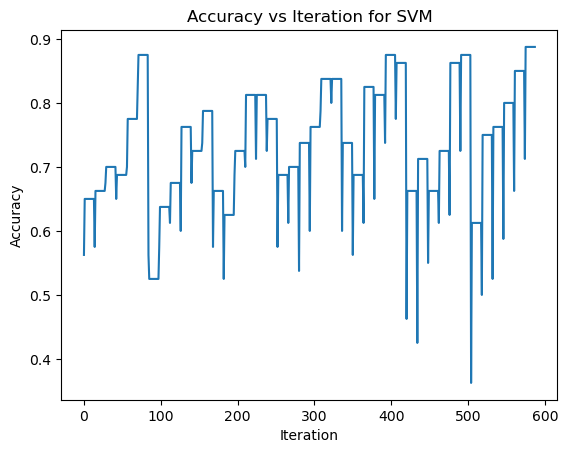

{'p': 18, 'r': 8, 'bin': 110}

In [19]:
def get_best_params_svm():
    train_path = r'train_dataset_1\\**\\*.pgm'
    test_path = r'test_dataset_1\\**\\*.pgm'

    best_params = {}
    best_accuracy = 0
    accuracies = []
    for p in range(12,19):
        for r in range(3,9):
            for bin in range(10,1410,100):
                train_data, train_label = get_data(train_path, p,r,'uniform', bin)
                test_data, test_label = get_data(test_path, p,r,'uniform', bin)

                svm = SVC(C= 0.1, gamma = 0.01, kernel='linear' , probability=True)
                svm.fit(train_data, train_label)

                # Calculate accuracy
                accuracy_svm = svm.score(test_data, test_label)
                if accuracy_svm > best_accuracy:
                    best_accuracy = accuracy_svm
                    best_params['p'] = p
                    best_params['r'] = r
                    best_params['bin'] = bin
                accuracies.append(accuracy_svm)
    # plot accuracy vs iteration
    plt.plot(accuracies)
    plt.xlabel('Iteration')
    plt.ylabel('Accuracy')
    plt.title('Accuracy vs Iteration for SVM')
    plt.show()

    return best_params

get_best_params_svm()

## Getting best LBP parameters for MLP

c:\Users\alime\anaconda3\Lib\site-packages\skimage\feature\texture.py:353: UserWarning: Applying `local_binary_pattern` to floating-point images may give unexpected results when small numerical differences between adjacent pixels are present. It is recommended to use this function with images of integer dtype.
  warnings.warn(
c:\Users\alime\anaconda3\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:691: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
c:\Users\alime\anaconda3\Lib\site-packages\skimage\feature\texture.py:353: UserWarning: Applying `local_binary_pattern` to floating-point images may give unexpected results when small numerical differences between adjacent pixels are present. It is recommended to use this function with images of integer dtype.
  warnings.warn(
c:\Users\alime\anaconda3\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:691: ConvergenceWa

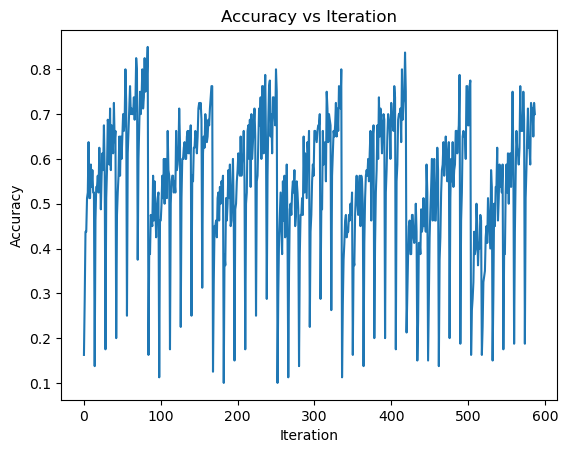

{'p': 12, 'r': 8, 'bin': 1310}

In [9]:
def get_best_params_mlp():
    train_path = r'train_dataset_1\\**\\*.pgm'
    test_path = r'test_dataset_1\\**\\*.pgm'
    best_params = {}
    best_accuracy = 0
    accuracies = []
    for p in range(12,19):
        for r in range(3,9):
            for bin in range(10,1410,100):
                train_data, train_label = get_data(train_path,p,r,'ror', bin)
                test_data, test_label = get_data(test_path, p,r,'ror', bin)

                mlp = MLPClassifier(hidden_layer_sizes=(128, 64, 128), learning_rate_init=0.001, random_state = 1, max_iter = 200, activation='relu')

                mlp.fit(train_data, train_label)

                prediction_mlp_1 = mlp.predict(test_data)
                accuracy = np.mean(prediction_mlp_1 == test_label)
                if accuracy > best_accuracy:
                    best_accuracy = accuracy
                    best_params['p'] = p
                    best_params['r'] = r
                    best_params['bin'] = bin
                accuracies.append(accuracy)
    # plot accuracy vs iteration
    plt.plot(accuracies)
    plt.xlabel('Iteration')
    plt.ylabel('Accuracy')
    plt.title('Accuracy vs Iteration')
    plt.show()

    return best_params

get_best_params_mlp()

mlp accuracy fold 1: 87.50%


c:\Users\alime\anaconda3\Lib\site-packages\skimage\feature\texture.py:353: UserWarning: Applying `local_binary_pattern` to floating-point images may give unexpected results when small numerical differences between adjacent pixels are present. It is recommended to use this function with images of integer dtype.
  warnings.warn(


mlp accuracy fold 2: 82.50%


c:\Users\alime\anaconda3\Lib\site-packages\skimage\feature\texture.py:353: UserWarning: Applying `local_binary_pattern` to floating-point images may give unexpected results when small numerical differences between adjacent pixels are present. It is recommended to use this function with images of integer dtype.
  warnings.warn(


mlp accuracy fold 3: 85.00%


c:\Users\alime\anaconda3\Lib\site-packages\skimage\feature\texture.py:353: UserWarning: Applying `local_binary_pattern` to floating-point images may give unexpected results when small numerical differences between adjacent pixels are present. It is recommended to use this function with images of integer dtype.
  warnings.warn(


mlp accuracy fold 4: 82.50%


c:\Users\alime\anaconda3\Lib\site-packages\skimage\feature\texture.py:353: UserWarning: Applying `local_binary_pattern` to floating-point images may give unexpected results when small numerical differences between adjacent pixels are present. It is recommended to use this function with images of integer dtype.
  warnings.warn(


mlp accuracy fold 5: 82.50%
Average accuracy: 84.00%


c:\Users\alime\anaconda3\Lib\site-packages\skimage\feature\texture.py:353: UserWarning: Applying `local_binary_pattern` to floating-point images may give unexpected results when small numerical differences between adjacent pixels are present. It is recommended to use this function with images of integer dtype.
  warnings.warn(


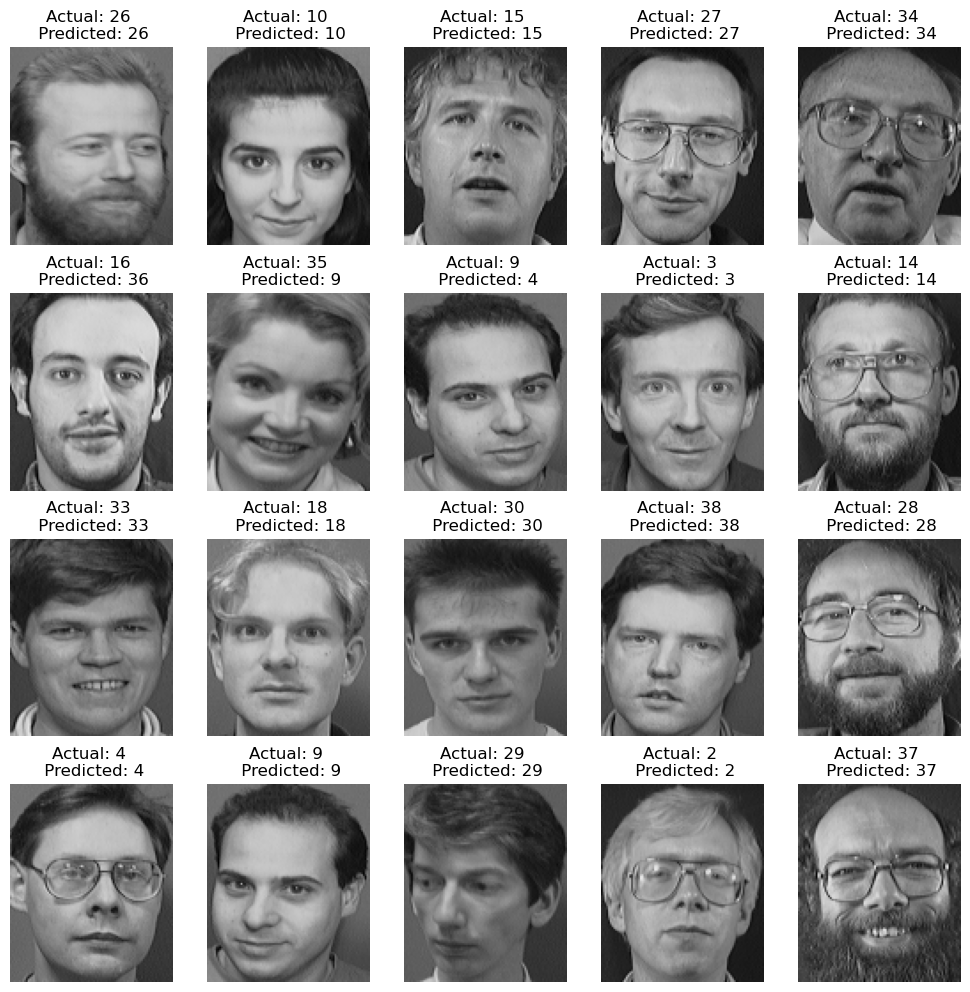

In [18]:
probability_matrix_mlp_1, prediction_mlp_1 =  MLP_model(1024, 512, 1024, 0.001, 'relu')


# best params
# lbp = feature.local_binary_pattern(img, 16, 8, method='ror')
# (hist, _) = np.histogram(lbp.ravel(), bins=1379, range=(0, 1379))


c:\Users\alime\anaconda3\Lib\site-packages\skimage\feature\texture.py:353: UserWarning: Applying `local_binary_pattern` to floating-point images may give unexpected results when small numerical differences between adjacent pixels are present. It is recommended to use this function with images of integer dtype.
  warnings.warn(


SVM accuracy fold 1: 88.75%


c:\Users\alime\anaconda3\Lib\site-packages\skimage\feature\texture.py:353: UserWarning: Applying `local_binary_pattern` to floating-point images may give unexpected results when small numerical differences between adjacent pixels are present. It is recommended to use this function with images of integer dtype.
  warnings.warn(


SVM accuracy fold 2: 86.25%


c:\Users\alime\anaconda3\Lib\site-packages\skimage\feature\texture.py:353: UserWarning: Applying `local_binary_pattern` to floating-point images may give unexpected results when small numerical differences between adjacent pixels are present. It is recommended to use this function with images of integer dtype.
  warnings.warn(


SVM accuracy fold 3: 78.75%


c:\Users\alime\anaconda3\Lib\site-packages\skimage\feature\texture.py:353: UserWarning: Applying `local_binary_pattern` to floating-point images may give unexpected results when small numerical differences between adjacent pixels are present. It is recommended to use this function with images of integer dtype.
  warnings.warn(


SVM accuracy fold 4: 81.25%


c:\Users\alime\anaconda3\Lib\site-packages\skimage\feature\texture.py:353: UserWarning: Applying `local_binary_pattern` to floating-point images may give unexpected results when small numerical differences between adjacent pixels are present. It is recommended to use this function with images of integer dtype.
  warnings.warn(


SVM accuracy fold 5: 83.75%
Average accuracy: 83.75%


c:\Users\alime\anaconda3\Lib\site-packages\skimage\feature\texture.py:353: UserWarning: Applying `local_binary_pattern` to floating-point images may give unexpected results when small numerical differences between adjacent pixels are present. It is recommended to use this function with images of integer dtype.
  warnings.warn(


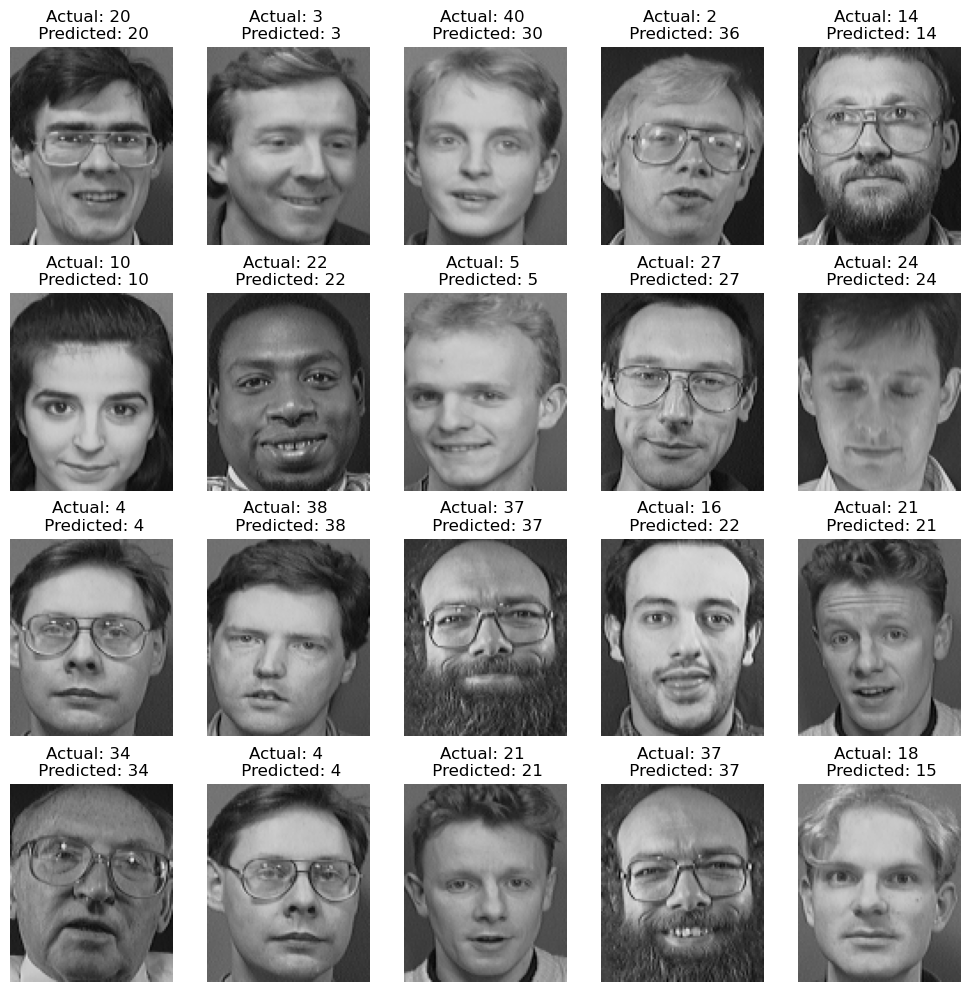

In [25]:
probability_matrix_svm_1, prediction_svm_1 = SVM_model(0.1, 0.01, 'linear')

## Images loading and preprocessing

In [471]:
def get_data(path):
    
    paths = glob(path, recursive=True)
    data = []
    label = []

    for path in paths:
        img = cv2.imread(path, 0)
        subject_label = path[path.rfind('s')+1:path.rfind('\\')]

        img = cv2.resize(img, (1, len(img)* len(img[0])))
        img = np.float32(np.array(img) / 255.0)

        data.append(img)
        label.append(int(subject_label))

    return np.array(data)[:,:,0], np.array(label)


## good for SVM
# def get_data(path):
    
#     paths = glob(path, recursive=True)
#     data = []
#     label = []

#     for path in paths:
#         img = cv2.imread(path, 0)
#         subject_label = path[path.rfind('s')+1:path.rfind('\\')]

#         # img = cv2.resize(img, (1, len(img)* len(img[0])))
#         img = np.float32(np.array(img) / 255.0)

#         # LBP feature extraction
#         lbp = feature.local_binary_pattern(img, 18, 8, method="uniform")
#         (hist, _) = np.histogram(lbp.ravel(), bins=59, range=(0, 59))

#         # normalize the histogram
#         hist = hist.astype("float")
#         # hist /= (hist.sum() + 1e-7)

#         data.append(hist)
#         label.append(int(subject_label))

#     return np.array(data), np.array(label)

## good for MLP
# from skimage import feature

# def get_data(path):
    
#     paths = glob(path, recursive=True)
#     data = []
#     label = []

#     for path in paths:
#         img = cv2.imread(path, 0)
#         subject_label = path[path.rfind('s')+1:path.rfind('\\')]

#         # img = cv2.resize(img, (1, len(img)* len(img[0])))
#         img = np.float32(np.array(img) / 255.0)

#         # LBP feature extraction
#         lbp = feature.local_binary_pattern(img, 16, 8, method='uniform')
#         (hist, _) = np.histogram(lbp.ravel(), bins=4790, range=(0, 4790))

#         # normalize the histogram
#         hist = hist.astype("float")
#         # hist /= (hist.sum() + 1e-7)

#         data.append(hist)
#         label.append(int(subject_label))

#     return np.array(data), np.array(label)

In [26]:
# function to plot the predictions

def plot_predictions(predictions, SVM = False):

    test_path = r'test_dataset_2\\**\\*.pgm'

    if SVM:
        test_data, test_label = get_data(test_path, 18, 8, 'uniform', 110)
    else:
        test_data, test_label = get_data(test_path, 12, 8, 'ror', 1310)

    # display faces and predicted vs actual labels

    DATASET_PATH = 'test_dataset'

    # Load the images
    images = []
    labels = []
    class_index = 0
    for class_name in classes:
        class_path = os.path.join('test_dataset_1', class_name)
        for image_name in os.listdir(class_path):
            image_path = os.path.join(class_path, image_name)
            image = cv2.imread(image_path)
            images.append(image)
            labels.append(class_index)
        class_index += 1
    images = np.array(images)
    labels = np.array(labels)

    # shuffle the dataset and labels and predictions in the same order
    # Generate a permutation of indices
    indices = np.arange(len(images))
    np.random.shuffle(indices)

    # Use the permutation to index into each array
    images = images[indices]
    test_label = test_label[indices]
    predictions = predictions[indices]


    plt.figure(figsize=(10, 10))
    for i in range(20):
        plt.subplot(4, 5, i + 1)  # 4 rows, 5 columns, subplot index from 1 to 20
        plt.imshow(images[i], cmap='gray')
        plt.axis('off')
        plt.title('Actual: {} \n Predicted: {}'.format(test_label[i], predictions[i]))

    plt.tight_layout()

In [27]:
def SVM_model(c_param, gamma_param, kernel_param):

    train_paths = [f'train_dataset_{i+1}\\**\\*.pgm' for i in range(5)]
    test_paths = [f'test_dataset_{i+1}\\**\\*.pgm' for i in range(5)]

    accuracies = []

    prediction_svm_ret = 0
    probability_matrix_svm = 0
    max_accuracy = 0

    for i in range(5):
        train_data, train_label = get_data(train_paths[i], 18, 8, 'uniform', 110)
        test_data, test_label = get_data(test_paths[i], 18, 8, 'uniform', 110)

        svm = SVC(C = c_param, gamma = gamma_param, kernel = kernel_param, probability=True)
        svm.fit(train_data, train_label)

        # probability matrix NxM where N is number of samples and M is the number of classes
        probability_matrix_svm = svm.predict_proba(test_data)

        # Make prediction
        prediction_svm = svm.predict(test_data)

        # Calculate accuracy
        accuracy_svm = svm.score(test_data, test_label)

        if accuracy_svm > max_accuracy:
            max_accuracy = accuracy_svm
            probability_matrix_svm = probability_matrix_svm
            prediction_svm_ret = prediction_svm

        accuracies.append(accuracy_svm)

        print('SVM accuracy fold {}: {:.2f}%'.format(i+1, accuracy_svm * 100))

    print('Average accuracy: {:.2f}%'.format(np.mean(accuracies) * 100))

    plot_predictions(prediction_svm, SVM = True)

    return probability_matrix_svm, prediction_svm_ret

## SVM C = 0.00001, gamma = 0.00001, kernel = linear

SVM accuracy fold 1: 72.50%


c:\Users\alime\anaconda3\Lib\site-packages\skimage\feature\texture.py:353: UserWarning: Applying `local_binary_pattern` to floating-point images may give unexpected results when small numerical differences between adjacent pixels are present. It is recommended to use this function with images of integer dtype.
  warnings.warn(


SVM accuracy fold 2: 77.50%


c:\Users\alime\anaconda3\Lib\site-packages\skimage\feature\texture.py:353: UserWarning: Applying `local_binary_pattern` to floating-point images may give unexpected results when small numerical differences between adjacent pixels are present. It is recommended to use this function with images of integer dtype.
  warnings.warn(


SVM accuracy fold 3: 63.75%


c:\Users\alime\anaconda3\Lib\site-packages\skimage\feature\texture.py:353: UserWarning: Applying `local_binary_pattern` to floating-point images may give unexpected results when small numerical differences between adjacent pixels are present. It is recommended to use this function with images of integer dtype.
  warnings.warn(


SVM accuracy fold 4: 65.00%


c:\Users\alime\anaconda3\Lib\site-packages\skimage\feature\texture.py:353: UserWarning: Applying `local_binary_pattern` to floating-point images may give unexpected results when small numerical differences between adjacent pixels are present. It is recommended to use this function with images of integer dtype.
  warnings.warn(


SVM accuracy fold 5: 58.75%
Average accuracy: 67.50%


c:\Users\alime\anaconda3\Lib\site-packages\skimage\feature\texture.py:353: UserWarning: Applying `local_binary_pattern` to floating-point images may give unexpected results when small numerical differences between adjacent pixels are present. It is recommended to use this function with images of integer dtype.
  warnings.warn(


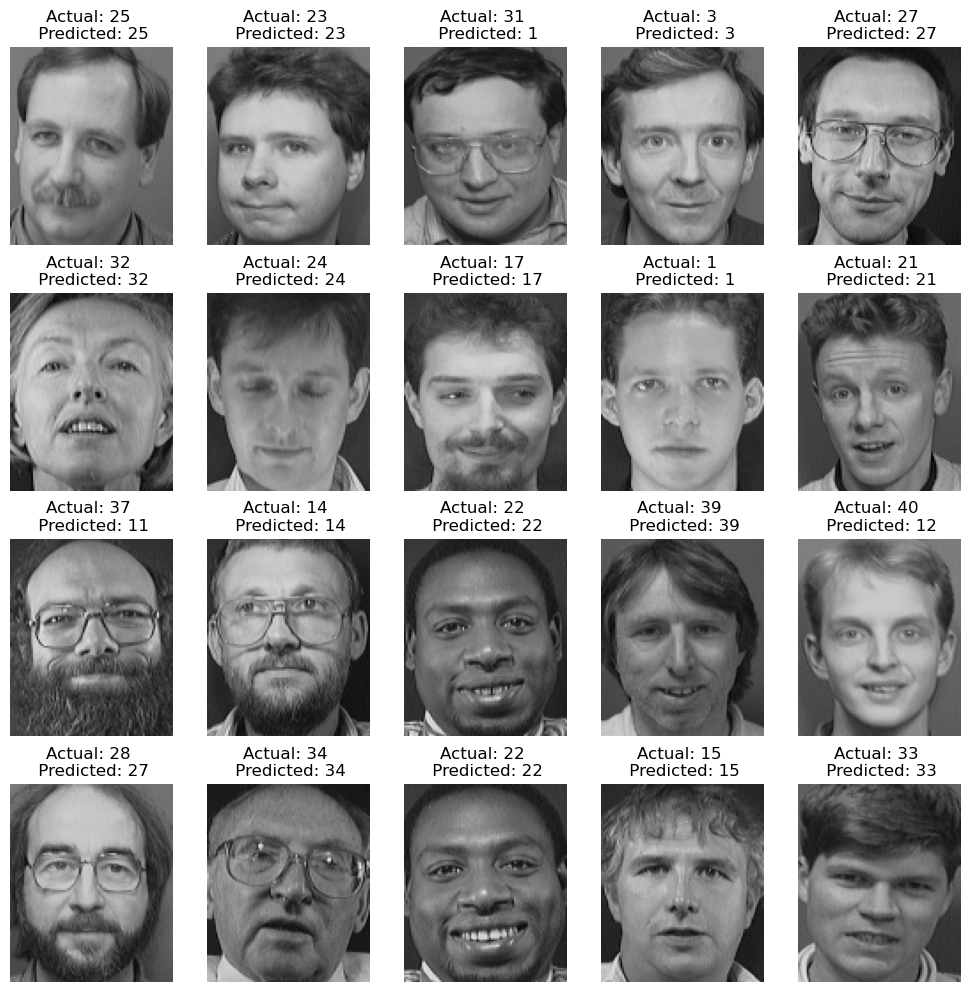

In [54]:
probability_matrix_svm_1, prediction_svm_1 = SVM_model(0.00001, 0.00001, 'linear')

## SVM C = 0.0001, gamma = 0.00001, kernel = linear

SVM accuracy fold 1: 87.50%


c:\Users\alime\anaconda3\Lib\site-packages\skimage\feature\texture.py:353: UserWarning: Applying `local_binary_pattern` to floating-point images may give unexpected results when small numerical differences between adjacent pixels are present. It is recommended to use this function with images of integer dtype.
  warnings.warn(


SVM accuracy fold 2: 86.25%


c:\Users\alime\anaconda3\Lib\site-packages\skimage\feature\texture.py:353: UserWarning: Applying `local_binary_pattern` to floating-point images may give unexpected results when small numerical differences between adjacent pixels are present. It is recommended to use this function with images of integer dtype.
  warnings.warn(


SVM accuracy fold 3: 80.00%


c:\Users\alime\anaconda3\Lib\site-packages\skimage\feature\texture.py:353: UserWarning: Applying `local_binary_pattern` to floating-point images may give unexpected results when small numerical differences between adjacent pixels are present. It is recommended to use this function with images of integer dtype.
  warnings.warn(


SVM accuracy fold 4: 78.75%


c:\Users\alime\anaconda3\Lib\site-packages\skimage\feature\texture.py:353: UserWarning: Applying `local_binary_pattern` to floating-point images may give unexpected results when small numerical differences between adjacent pixels are present. It is recommended to use this function with images of integer dtype.
  warnings.warn(


SVM accuracy fold 5: 82.50%
Average accuracy: 83.00%


c:\Users\alime\anaconda3\Lib\site-packages\skimage\feature\texture.py:353: UserWarning: Applying `local_binary_pattern` to floating-point images may give unexpected results when small numerical differences between adjacent pixels are present. It is recommended to use this function with images of integer dtype.
  warnings.warn(


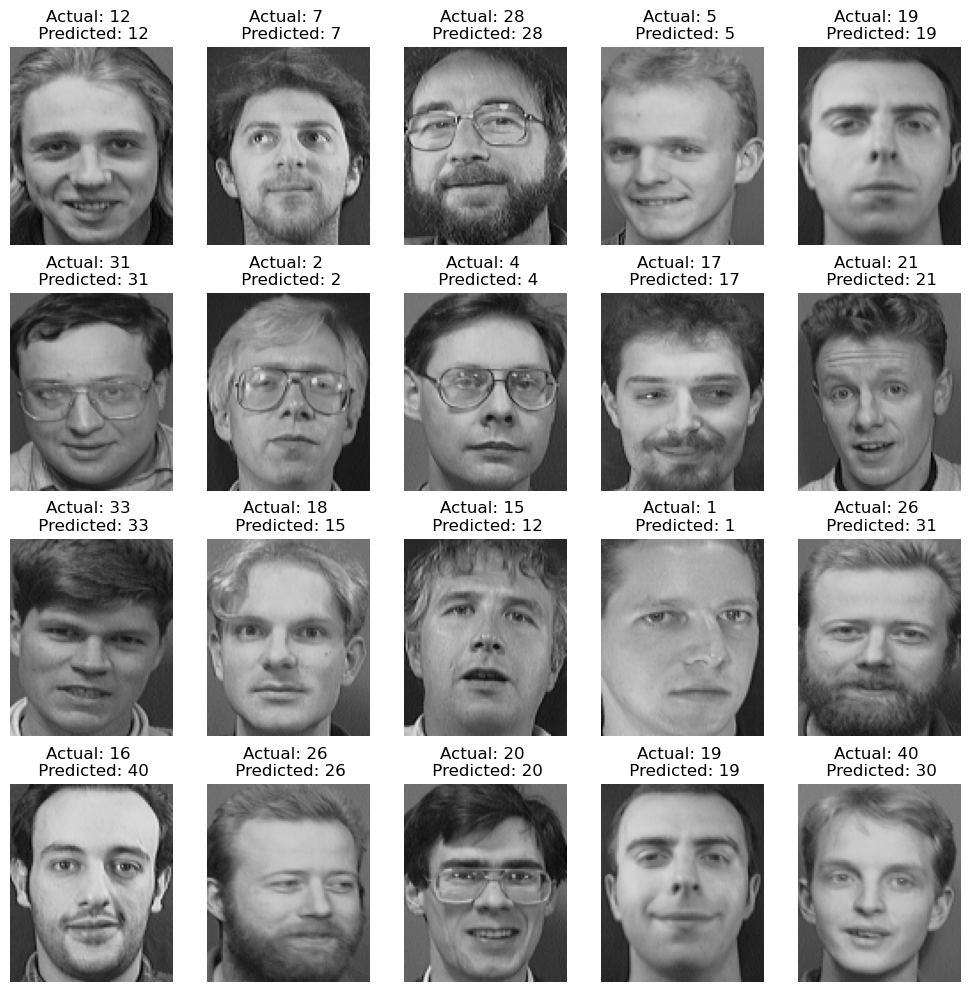

In [56]:
probability_matrix_svm_2, prediction_svm_2 = SVM_model(0.0001, 0.00001, 'linear')

## SVM C = 0.001, gamma = 0.00001, kernel = linear

SVM accuracy fold 1: 88.75%


c:\Users\alime\anaconda3\Lib\site-packages\skimage\feature\texture.py:353: UserWarning: Applying `local_binary_pattern` to floating-point images may give unexpected results when small numerical differences between adjacent pixels are present. It is recommended to use this function with images of integer dtype.
  warnings.warn(


SVM accuracy fold 2: 86.25%


c:\Users\alime\anaconda3\Lib\site-packages\skimage\feature\texture.py:353: UserWarning: Applying `local_binary_pattern` to floating-point images may give unexpected results when small numerical differences between adjacent pixels are present. It is recommended to use this function with images of integer dtype.
  warnings.warn(


SVM accuracy fold 3: 78.75%


c:\Users\alime\anaconda3\Lib\site-packages\skimage\feature\texture.py:353: UserWarning: Applying `local_binary_pattern` to floating-point images may give unexpected results when small numerical differences between adjacent pixels are present. It is recommended to use this function with images of integer dtype.
  warnings.warn(


SVM accuracy fold 4: 81.25%


c:\Users\alime\anaconda3\Lib\site-packages\skimage\feature\texture.py:353: UserWarning: Applying `local_binary_pattern` to floating-point images may give unexpected results when small numerical differences between adjacent pixels are present. It is recommended to use this function with images of integer dtype.
  warnings.warn(


SVM accuracy fold 5: 83.75%
Average accuracy: 83.75%


c:\Users\alime\anaconda3\Lib\site-packages\skimage\feature\texture.py:353: UserWarning: Applying `local_binary_pattern` to floating-point images may give unexpected results when small numerical differences between adjacent pixels are present. It is recommended to use this function with images of integer dtype.
  warnings.warn(


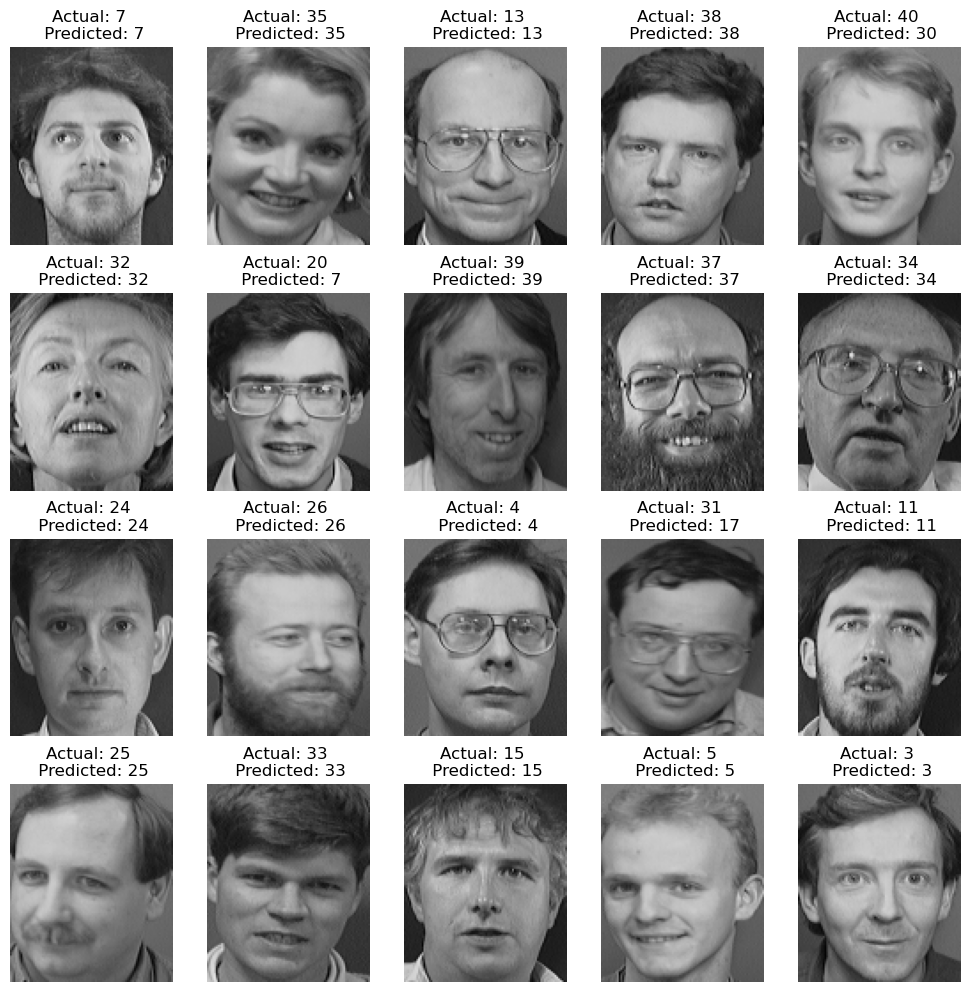

In [57]:
probability_matrix_svm_3, prediction_svm_3 = SVM_model(0.001, 0.00001, 'linear')

## SVM C = 0.01, gamma = 0.00001, kernel = linear

SVM accuracy fold 1: 88.75%


c:\Users\alime\anaconda3\Lib\site-packages\skimage\feature\texture.py:353: UserWarning: Applying `local_binary_pattern` to floating-point images may give unexpected results when small numerical differences between adjacent pixels are present. It is recommended to use this function with images of integer dtype.
  warnings.warn(


SVM accuracy fold 2: 86.25%


c:\Users\alime\anaconda3\Lib\site-packages\skimage\feature\texture.py:353: UserWarning: Applying `local_binary_pattern` to floating-point images may give unexpected results when small numerical differences between adjacent pixels are present. It is recommended to use this function with images of integer dtype.
  warnings.warn(


SVM accuracy fold 3: 78.75%


c:\Users\alime\anaconda3\Lib\site-packages\skimage\feature\texture.py:353: UserWarning: Applying `local_binary_pattern` to floating-point images may give unexpected results when small numerical differences between adjacent pixels are present. It is recommended to use this function with images of integer dtype.
  warnings.warn(


SVM accuracy fold 4: 81.25%


c:\Users\alime\anaconda3\Lib\site-packages\skimage\feature\texture.py:353: UserWarning: Applying `local_binary_pattern` to floating-point images may give unexpected results when small numerical differences between adjacent pixels are present. It is recommended to use this function with images of integer dtype.
  warnings.warn(


SVM accuracy fold 5: 83.75%
Average accuracy: 83.75%


c:\Users\alime\anaconda3\Lib\site-packages\skimage\feature\texture.py:353: UserWarning: Applying `local_binary_pattern` to floating-point images may give unexpected results when small numerical differences between adjacent pixels are present. It is recommended to use this function with images of integer dtype.
  warnings.warn(


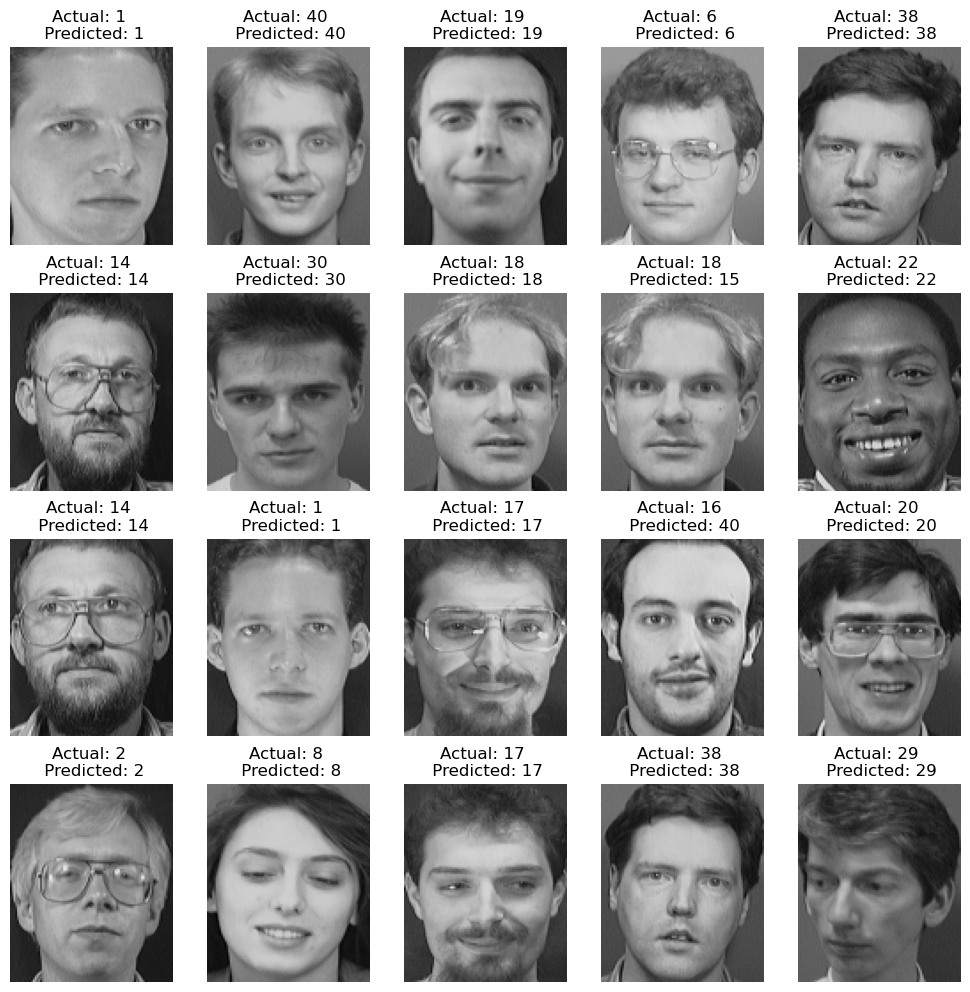

In [58]:
probability_matrix_svm_4, prediction_svm_4 = SVM_model(0.01, 0.00001, 'linear')

## SVM C = 0.001, gamma = 0.0001, kernel = linear

SVM accuracy fold 1: 88.75%


c:\Users\alime\anaconda3\Lib\site-packages\skimage\feature\texture.py:353: UserWarning: Applying `local_binary_pattern` to floating-point images may give unexpected results when small numerical differences between adjacent pixels are present. It is recommended to use this function with images of integer dtype.
  warnings.warn(


SVM accuracy fold 2: 86.25%


c:\Users\alime\anaconda3\Lib\site-packages\skimage\feature\texture.py:353: UserWarning: Applying `local_binary_pattern` to floating-point images may give unexpected results when small numerical differences between adjacent pixels are present. It is recommended to use this function with images of integer dtype.
  warnings.warn(


SVM accuracy fold 3: 78.75%


c:\Users\alime\anaconda3\Lib\site-packages\skimage\feature\texture.py:353: UserWarning: Applying `local_binary_pattern` to floating-point images may give unexpected results when small numerical differences between adjacent pixels are present. It is recommended to use this function with images of integer dtype.
  warnings.warn(


SVM accuracy fold 4: 81.25%


c:\Users\alime\anaconda3\Lib\site-packages\skimage\feature\texture.py:353: UserWarning: Applying `local_binary_pattern` to floating-point images may give unexpected results when small numerical differences between adjacent pixels are present. It is recommended to use this function with images of integer dtype.
  warnings.warn(


SVM accuracy fold 5: 83.75%
Average accuracy: 83.75%


c:\Users\alime\anaconda3\Lib\site-packages\skimage\feature\texture.py:353: UserWarning: Applying `local_binary_pattern` to floating-point images may give unexpected results when small numerical differences between adjacent pixels are present. It is recommended to use this function with images of integer dtype.
  warnings.warn(


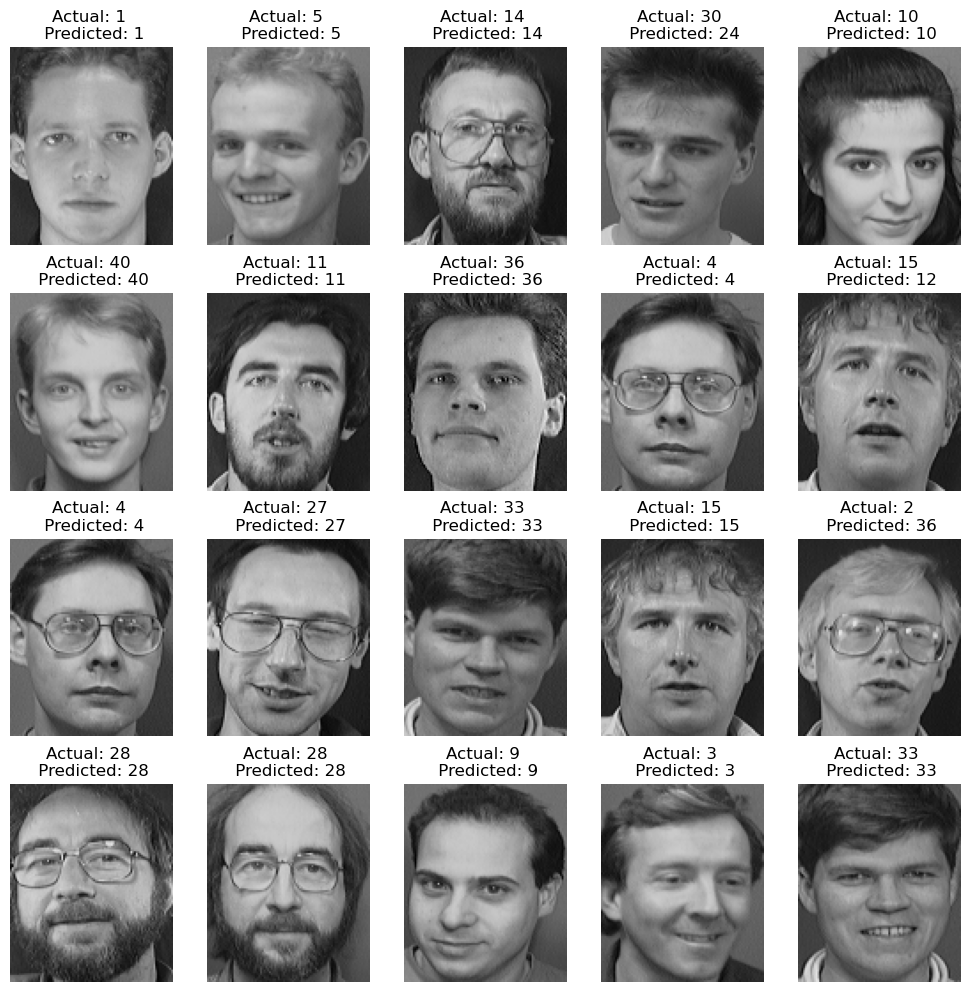

In [60]:
probability_matrix_svm_5, prediction_svm_5 = SVM_model(0.001,0.0001, 'linear')

## SVM C = 0.001, gamma = 0.000001, kernel = linear

SVM accuracy fold 1: 88.75%


c:\Users\alime\anaconda3\Lib\site-packages\skimage\feature\texture.py:353: UserWarning: Applying `local_binary_pattern` to floating-point images may give unexpected results when small numerical differences between adjacent pixels are present. It is recommended to use this function with images of integer dtype.
  warnings.warn(


SVM accuracy fold 2: 86.25%


c:\Users\alime\anaconda3\Lib\site-packages\skimage\feature\texture.py:353: UserWarning: Applying `local_binary_pattern` to floating-point images may give unexpected results when small numerical differences between adjacent pixels are present. It is recommended to use this function with images of integer dtype.
  warnings.warn(


SVM accuracy fold 3: 78.75%


c:\Users\alime\anaconda3\Lib\site-packages\skimage\feature\texture.py:353: UserWarning: Applying `local_binary_pattern` to floating-point images may give unexpected results when small numerical differences between adjacent pixels are present. It is recommended to use this function with images of integer dtype.
  warnings.warn(


SVM accuracy fold 4: 81.25%


c:\Users\alime\anaconda3\Lib\site-packages\skimage\feature\texture.py:353: UserWarning: Applying `local_binary_pattern` to floating-point images may give unexpected results when small numerical differences between adjacent pixels are present. It is recommended to use this function with images of integer dtype.
  warnings.warn(


SVM accuracy fold 5: 83.75%
Average accuracy: 83.75%


c:\Users\alime\anaconda3\Lib\site-packages\skimage\feature\texture.py:353: UserWarning: Applying `local_binary_pattern` to floating-point images may give unexpected results when small numerical differences between adjacent pixels are present. It is recommended to use this function with images of integer dtype.
  warnings.warn(


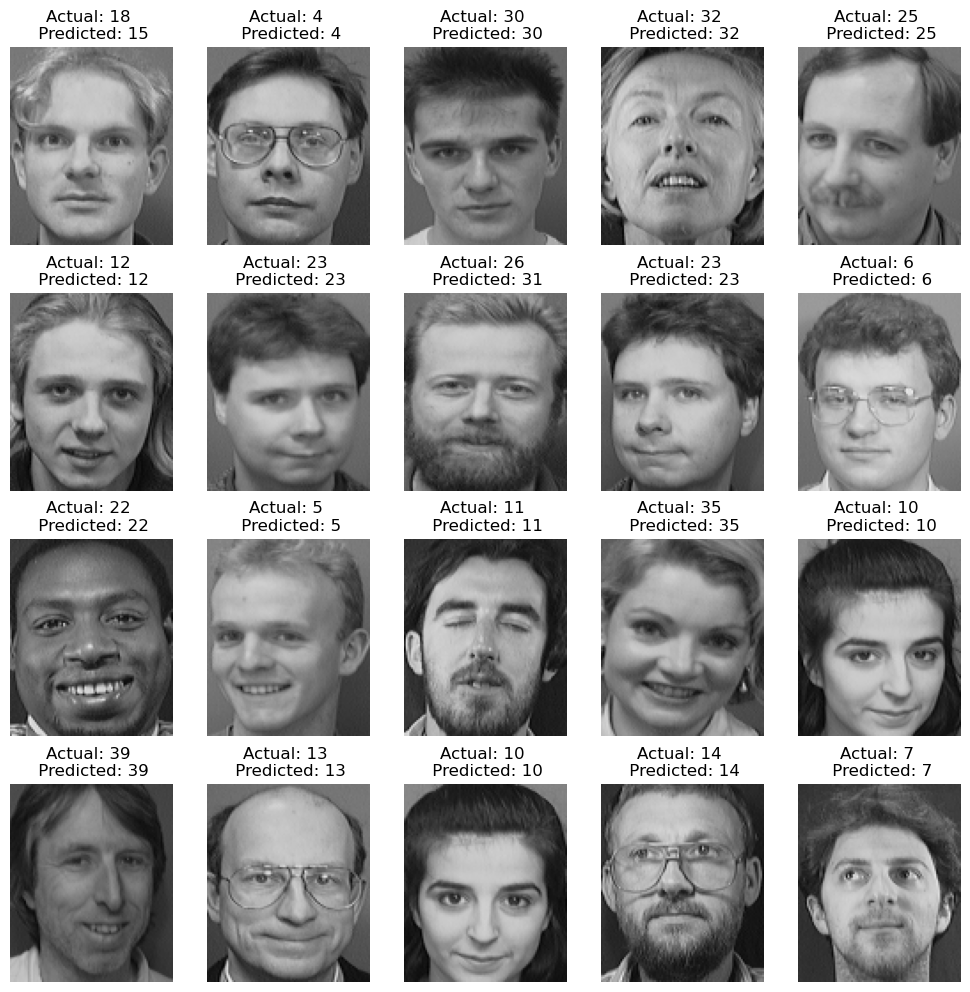

In [61]:
probability_matrix_svm_6, prediction_svm_6 = SVM_model(0.001, 0.000001, 'linear')

## SVM C = 0.001, gamma = 0.00001, kernel = rbf

SVM accuracy fold 1: 60.00%


c:\Users\alime\anaconda3\Lib\site-packages\skimage\feature\texture.py:353: UserWarning: Applying `local_binary_pattern` to floating-point images may give unexpected results when small numerical differences between adjacent pixels are present. It is recommended to use this function with images of integer dtype.
  warnings.warn(


SVM accuracy fold 2: 60.00%


c:\Users\alime\anaconda3\Lib\site-packages\skimage\feature\texture.py:353: UserWarning: Applying `local_binary_pattern` to floating-point images may give unexpected results when small numerical differences between adjacent pixels are present. It is recommended to use this function with images of integer dtype.
  warnings.warn(


SVM accuracy fold 3: 52.50%


c:\Users\alime\anaconda3\Lib\site-packages\skimage\feature\texture.py:353: UserWarning: Applying `local_binary_pattern` to floating-point images may give unexpected results when small numerical differences between adjacent pixels are present. It is recommended to use this function with images of integer dtype.
  warnings.warn(


SVM accuracy fold 4: 53.75%


c:\Users\alime\anaconda3\Lib\site-packages\skimage\feature\texture.py:353: UserWarning: Applying `local_binary_pattern` to floating-point images may give unexpected results when small numerical differences between adjacent pixels are present. It is recommended to use this function with images of integer dtype.
  warnings.warn(


SVM accuracy fold 5: 50.00%
Average accuracy: 55.25%


c:\Users\alime\anaconda3\Lib\site-packages\skimage\feature\texture.py:353: UserWarning: Applying `local_binary_pattern` to floating-point images may give unexpected results when small numerical differences between adjacent pixels are present. It is recommended to use this function with images of integer dtype.
  warnings.warn(


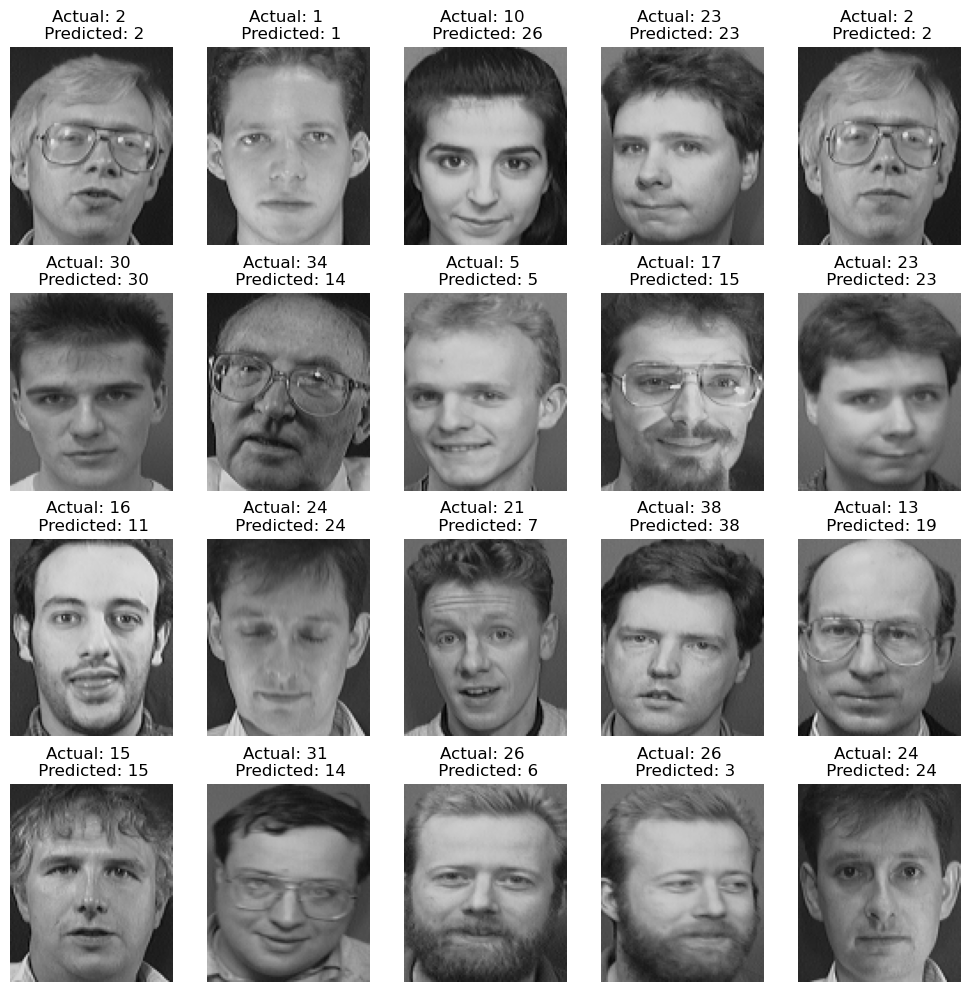

In [65]:
probability_matrix_svm_7, prediction_svm_7 = SVM_model(0.001, 0.00001, 'rbf')

In [91]:
def generate_roc_det_curve(prob_mat):
    test_path = r'test_dataset_1\\**\\*.pgm'
    test_data, test_label = get_data(test_path, 18, 8, 'uniform', 110)
    
    roc_fpr = np.zeros((40, 100))
    roc_tpr = np.zeros((40, 100))

    det_fpr = np.zeros((40, 100))
    det_fnr = np.zeros((40, 100))

    fig, [ax_roc, ax_det] = plt.subplots(1, 2, figsize=(11, 5))

    for i in range(1,40):
        

        fpr, tpr, _ = roc_curve(test_label == i, prob_mat[:, i])

        roc_fpr[i] = np.linspace(min(fpr), max(fpr), 100)
        roc_tpr[i] = np.interp(roc_fpr[i], fpr, tpr)

        fpr, fnr, _ = det_curve(test_label[:] == i, prob_mat[:, i])
        det_fpr[i] = np.linspace(min(fpr), max(fpr), 100)
        det_fnr[i] = np.interp(det_fpr[i], fpr, fnr)

    roc_mid_fpr = np.mean(roc_fpr, axis=0)
    roc_mid_tpr = np.mean(roc_tpr, axis=0)
    ax_roc.plot(roc_mid_fpr, roc_mid_tpr, label='ROC curve')

    det_mid_fpr = np.mean(det_fpr, axis=0)
    det_mid_fnr = np.mean(det_fnr, axis=0)
    ax_det.plot(det_mid_fpr, det_mid_fnr, label='DET curve')

    # draw a dotted line through the origin
    ax_roc.plot([0, 1], [0, 1], 'k--')
    ax_det.plot([0, 1], [1, 0], 'k--')

    ax_roc.set_xlabel('False Positive Rate')
    ax_roc.set_ylabel('True Positive Rate')
    ax_roc.set_title('ROC Curve')

    ax_det.set_xlabel('False Positive Rate')
    ax_det.set_ylabel('False Negative Rate')
    ax_det.set_title('DET Curve')

    # # put fprr and fnr on the same scale
    # ax_det.set_aspect('equal', adjustable='box')

    # #print fpr and fnr on plot
    # for i in range(1, 40, 5):
    #     ax_roc.text(roc_mid_fpr[i], roc_mid_tpr[i], str(i))
    #     ax_det.text(det_mid_fpr[i], det_mid_fnr[i], str(i))




In [93]:
def generate_roc_det_curve(prob_mat):
    test_path = r'test_dataset_1\\**\\*.pgm'
    test_data, test_label = get_data(test_path, 18, 8, 'uniform', 110)

    roc_fpr = np.zeros((40, 100))
    roc_tpr = np.zeros((40, 100))

    fig, [ax_roc, ax_det] = plt.subplots(1, 2, figsize=(11, 5))

    for i in range(40):  # Assuming class labels start at 0
        fpr, tpr, _ = roc_curve(test_label == i, prob_mat[:, i])
        roc_fpr[i] = np.linspace(min(fpr), max(fpr), 100)
        roc_tpr[i] = np.interp(roc_fpr[i], fpr, tpr)
        # fnr = 1 - tpr  # Calculating FNR from TPR
        # ax_roc.plot(fpr, tpr, label=f'Class {i+1} ROC')  # Optional per-class ROC curves
        # ax_det.plot(fpr, fnr, label=f'Class {i+1} DET')  # Optional per-class DET curves

    roc_mid_fpr = np.mean(roc_fpr, axis=0)
    roc_mid_tpr = np.mean(roc_tpr, axis=0)
    ax_roc.plot(roc_mid_fpr, roc_mid_tpr, label='ROC curve')

    ax_roc.plot([0, 1], [0, 1], 'k--', label='Chance Level')
    ax_roc.set_xlabel('False Positive Rate')
    ax_roc.set_ylabel('True Positive Rate')
    ax_roc.set_title('ROC Curve')

    ax_det.set_xlabel('False Positive Rate')
    ax_det.set_ylabel('False Negative Rate')
    ax_det.set_title('DET Curve')
    ax_det.set_xlim([0, 1])
    ax_det.set_ylim([0, 1])

    ax_roc.legend(loc='lower right')
    ax_det.legend(loc='upper right')

    plt.show()


In [165]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.metrics import roc_curve, auc


def generate_roc_det_curve(prob_mat):
    test_path = r'test_dataset_1\\**\\*.pgm'
    test_data, test_label = get_data(test_path, 18, 8, 'uniform', 110)
    fig, [ax_roc, ax_det] = plt.subplots(1, 2, figsize=(11, 5))

    # Compute ROC curve and ROC area for each class
    roc_auc = dict()
    
    fpr, tpr, _ = roc_curve(test_label == 27, prob_mat[:, 27])
    roc_auc[27] = auc(fpr, tpr)
    ax_roc.plot(fpr, tpr, lw=2, label='Class {0} (area = {1:0.2f})'.format(i, roc_auc[27]))
    ax_roc.plot([0, 1], [0, 1], 'k--', lw=2)
    ax_roc.set_xlabel('False Positive Rate')
    ax_roc.set_ylabel('True Positive Rate')
    ax_roc.set_title('ROC Curve')

    fpr, fnr, _ = det_curve(test_label[:] == 1, prob_mat[:, 1])
    det_fpr = np.linspace(min(fpr), max(fpr), 100)
    det_fnr = np.interp(det_fpr[1], fpr, fnr)

    ax_det.plot(fpr, fnr, label='DET curve')
    ax_det.set_xlabel('False Positive Rate')
    ax_det.set_ylabel('False Negative Rate')
    ax_det.plot([0, 1], [1, 0], 'k--')
    ax_det.set_title('DET Curve')


# Looking at the different ROC and DET curves

c:\Users\alime\anaconda3\Lib\site-packages\skimage\feature\texture.py:353: UserWarning: Applying `local_binary_pattern` to floating-point images may give unexpected results when small numerical differences between adjacent pixels are present. It is recommended to use this function with images of integer dtype.
  warnings.warn(
c:\Users\alime\anaconda3\Lib\site-packages\skimage\feature\texture.py:353: UserWarning: Applying `local_binary_pattern` to floating-point images may give unexpected results when small numerical differences between adjacent pixels are present. It is recommended to use this function with images of integer dtype.
  warnings.warn(
c:\Users\alime\anaconda3\Lib\site-packages\skimage\feature\texture.py:353: UserWarning: Applying `local_binary_pattern` to floating-point images may give unexpected results when small numerical differences between adjacent pixels are present. It is recommended to use this function with images of integer dtype.
  warnings.warn(
c:\Users\alim

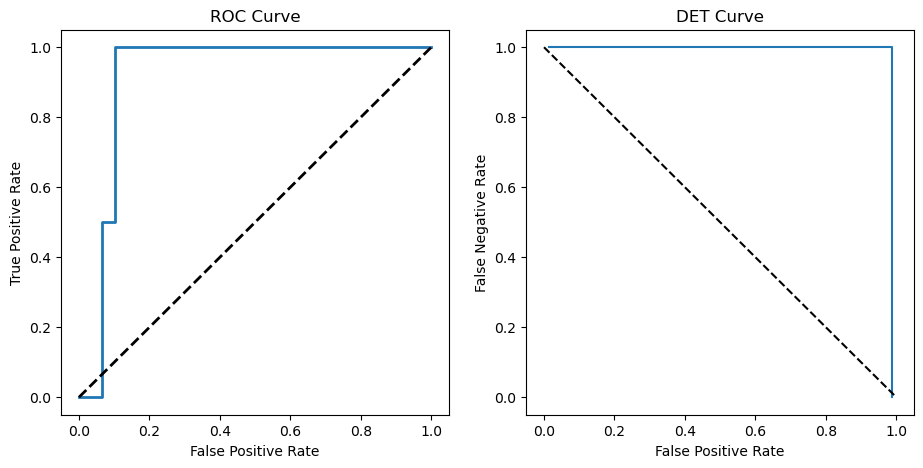

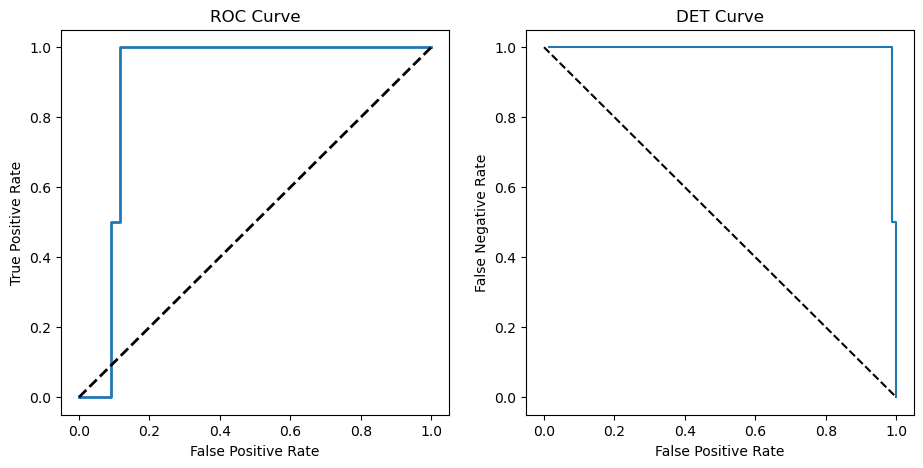

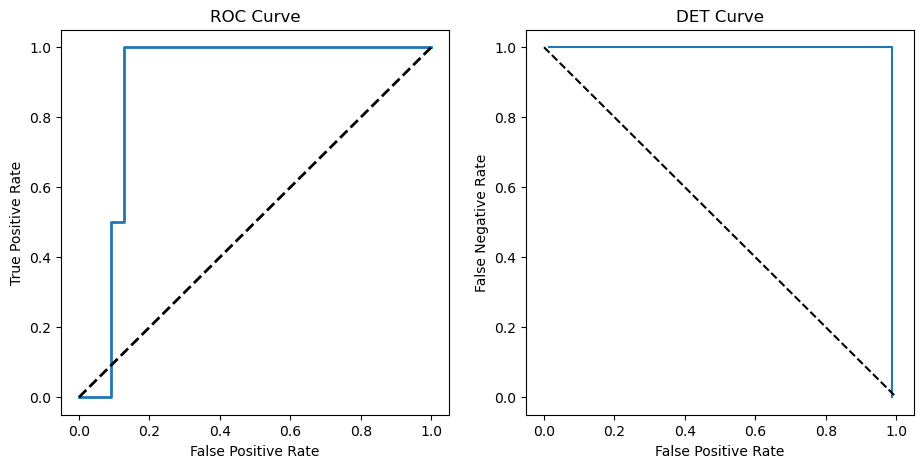

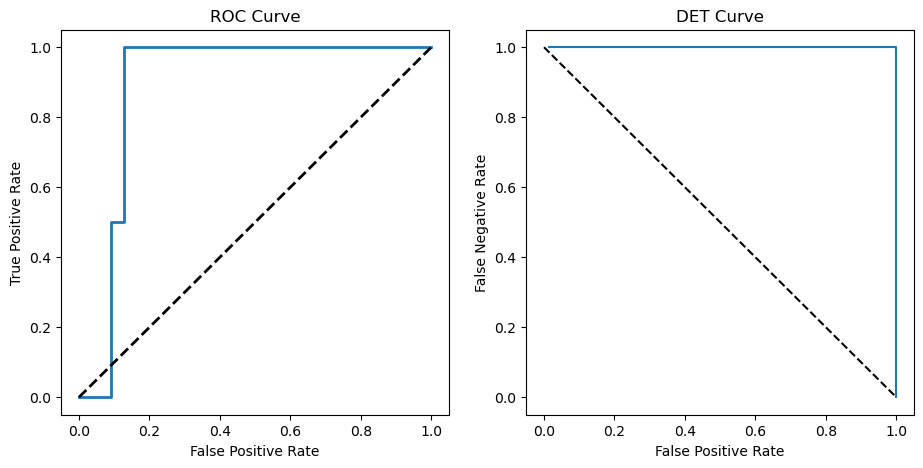

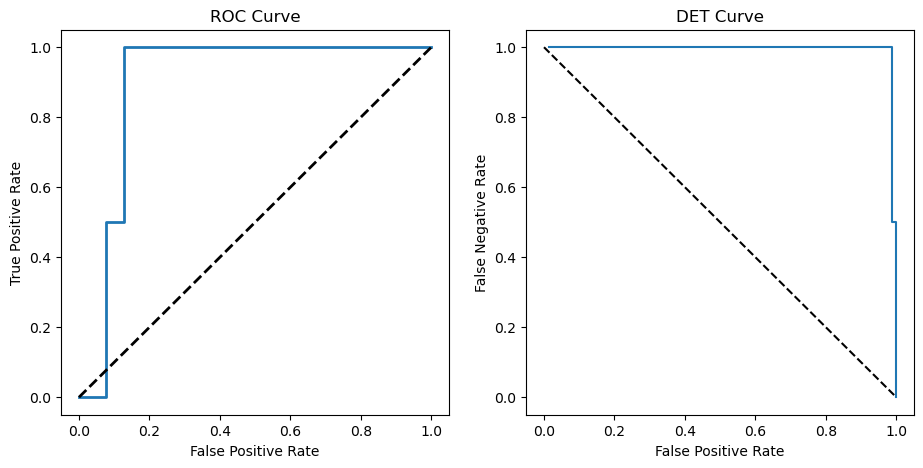

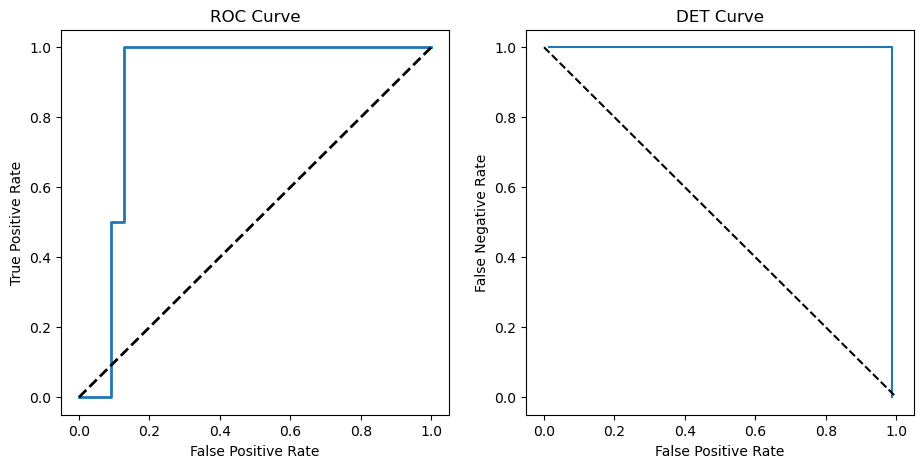

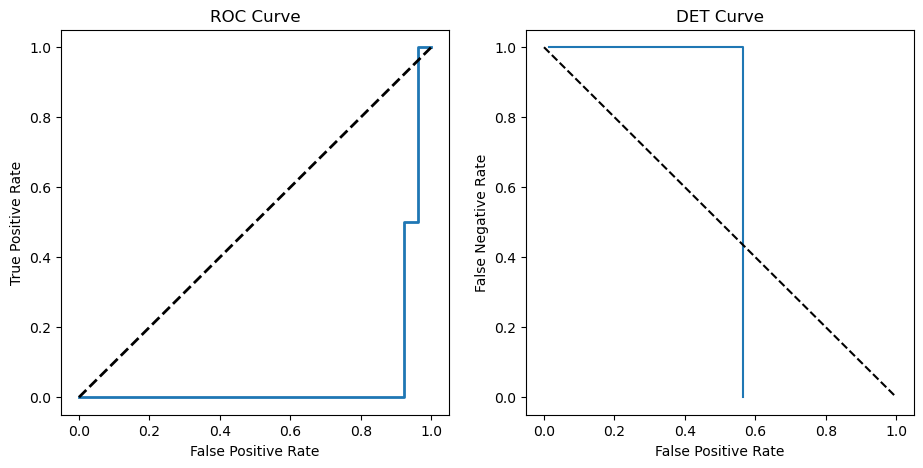

In [173]:
generate_roc_det_curve(probability_matrix_svm_1)
generate_roc_det_curve(probability_matrix_svm_2)
generate_roc_det_curve(probability_matrix_svm_3)
generate_roc_det_curve(probability_matrix_svm_4)
generate_roc_det_curve(probability_matrix_svm_5)
generate_roc_det_curve(probability_matrix_svm_6)
generate_roc_det_curve(probability_matrix_svm_7)

# Confustion matrix

In [169]:
# confusion matrix
def generate_confusion_matrix(pred):
    test_path = r'test_dataset_1\\**\\*.pgm'
    test_data, test_label = get_data(test_path, 18, 8, 'uniform', 110)
    conf_matrix = confusion_matrix(test_label, pred)
    conf_matrix = conf_matrix / np.sum(conf_matrix, axis=1)
    conf_matrix = np.round(conf_matrix, 2)
    df_cm = pd.DataFrame(conf_matrix, index = [i for i in range(0, 40)],
                    columns = [i for i in range(0, 40)])
    plt.figure(figsize = (20,20))
    sns.heatmap(df_cm, annot=True)
    plt.show()


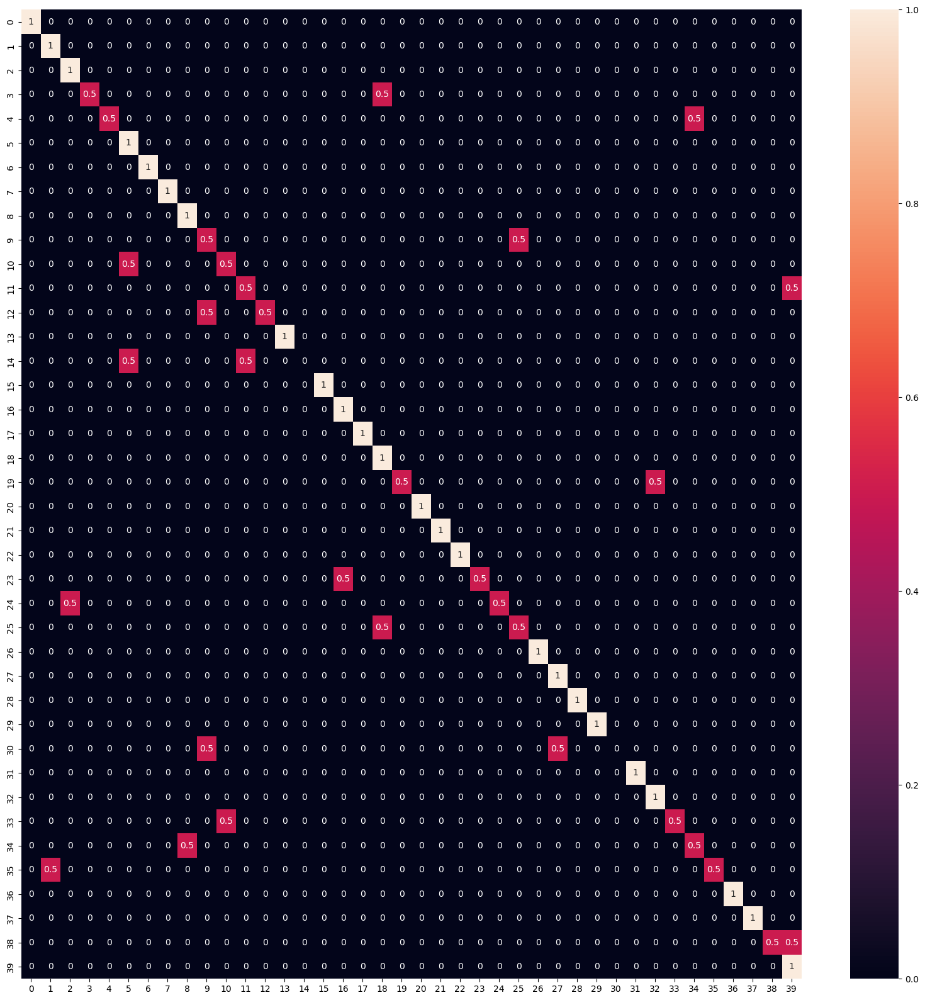

c:\Users\alime\anaconda3\Lib\site-packages\skimage\feature\texture.py:353: UserWarning: Applying `local_binary_pattern` to floating-point images may give unexpected results when small numerical differences between adjacent pixels are present. It is recommended to use this function with images of integer dtype.
  warnings.warn(


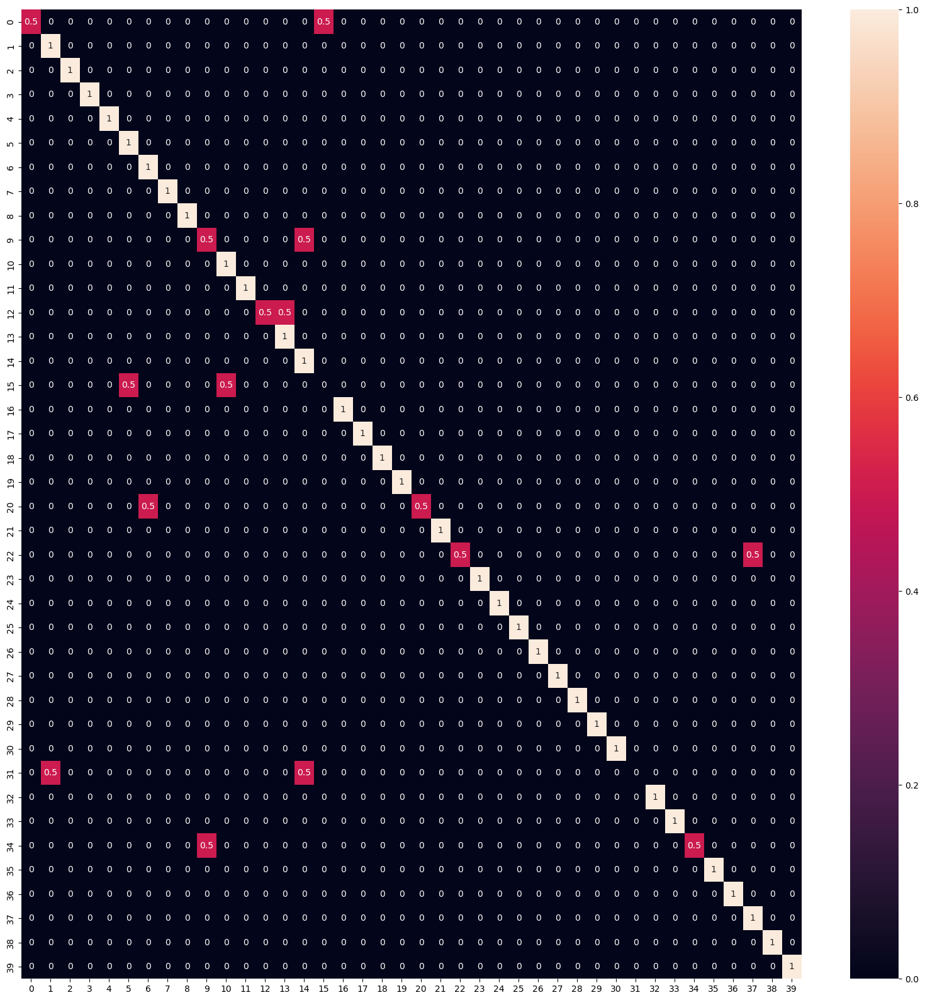

c:\Users\alime\anaconda3\Lib\site-packages\skimage\feature\texture.py:353: UserWarning: Applying `local_binary_pattern` to floating-point images may give unexpected results when small numerical differences between adjacent pixels are present. It is recommended to use this function with images of integer dtype.
  warnings.warn(


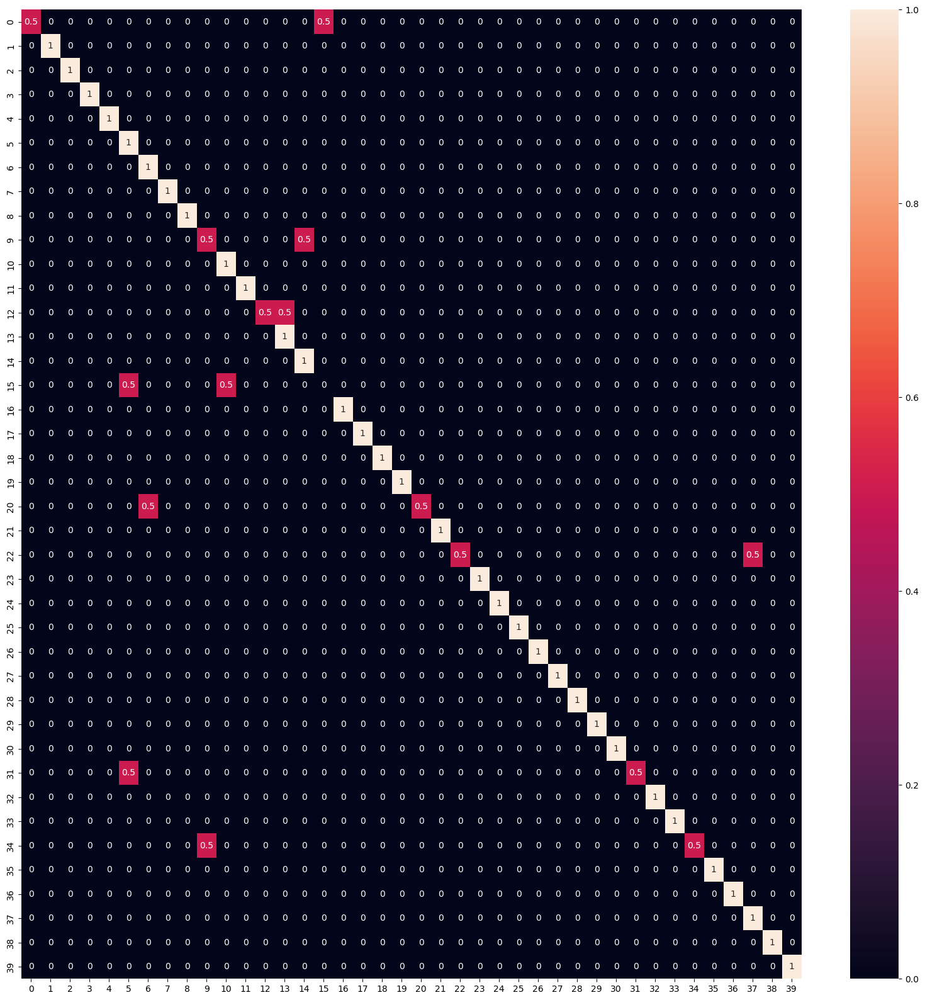

c:\Users\alime\anaconda3\Lib\site-packages\skimage\feature\texture.py:353: UserWarning: Applying `local_binary_pattern` to floating-point images may give unexpected results when small numerical differences between adjacent pixels are present. It is recommended to use this function with images of integer dtype.
  warnings.warn(


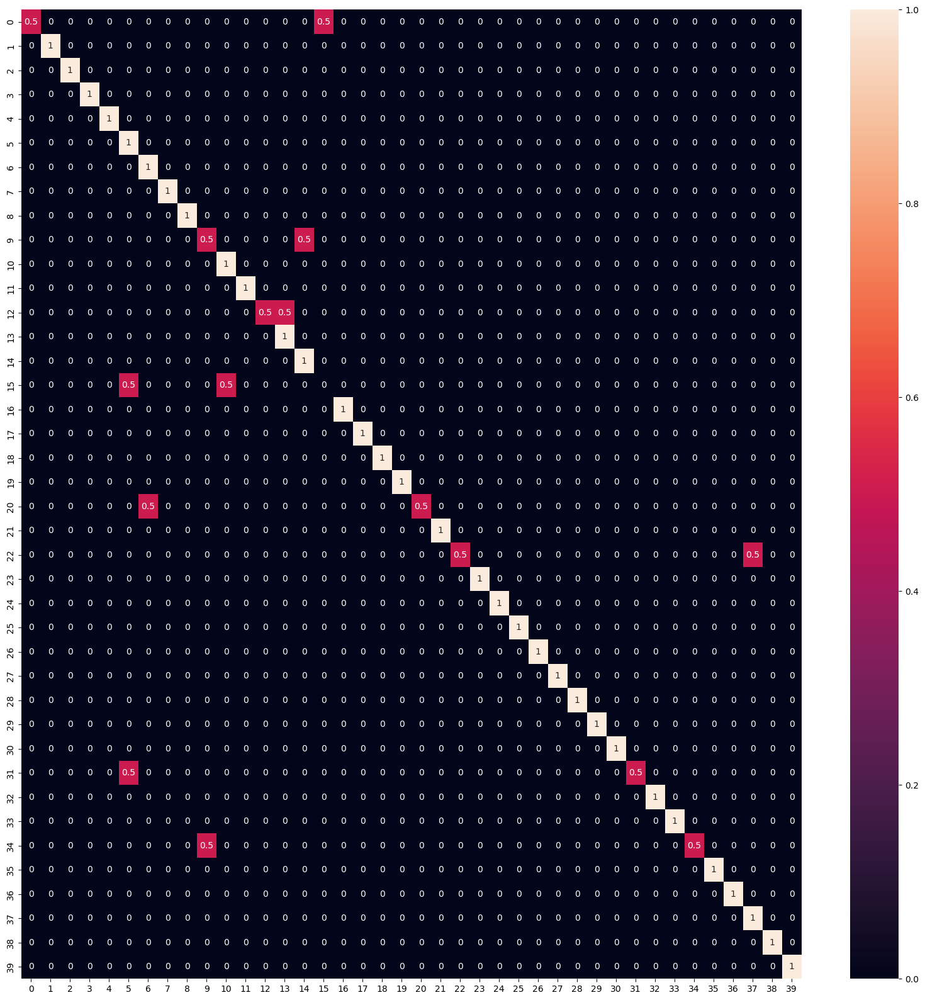

c:\Users\alime\anaconda3\Lib\site-packages\skimage\feature\texture.py:353: UserWarning: Applying `local_binary_pattern` to floating-point images may give unexpected results when small numerical differences between adjacent pixels are present. It is recommended to use this function with images of integer dtype.
  warnings.warn(


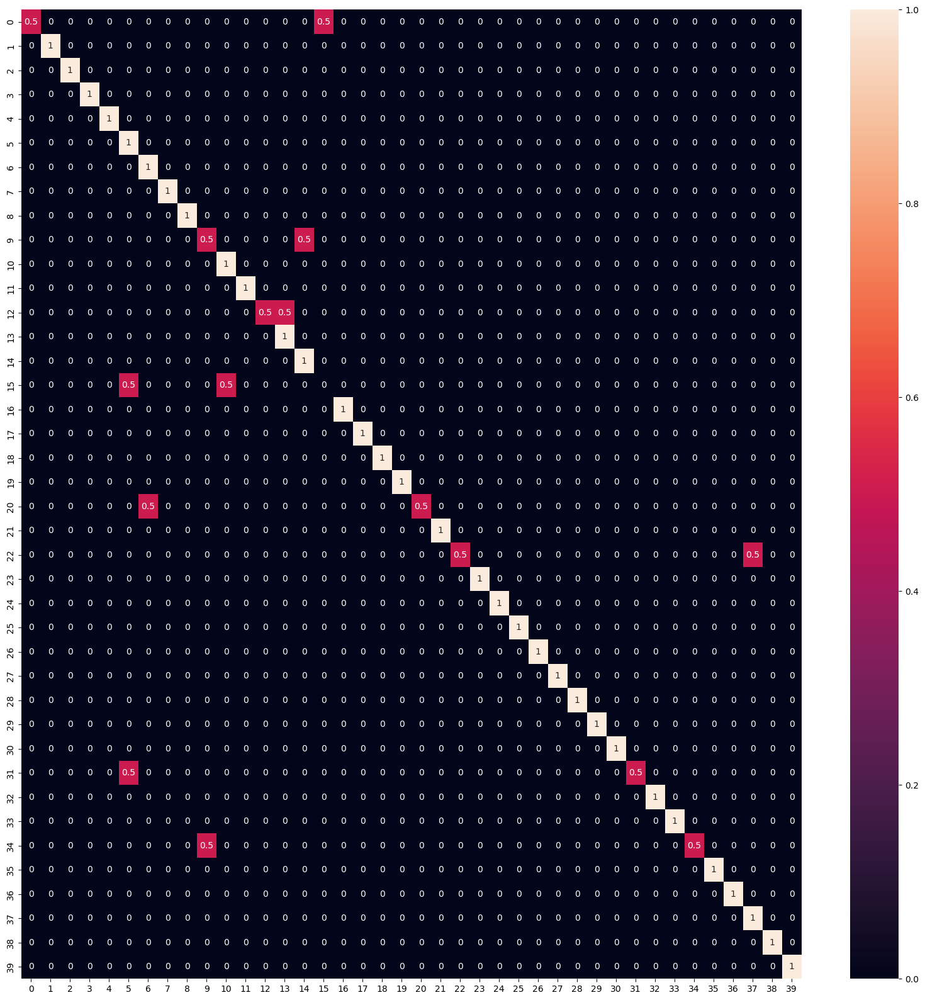

c:\Users\alime\anaconda3\Lib\site-packages\skimage\feature\texture.py:353: UserWarning: Applying `local_binary_pattern` to floating-point images may give unexpected results when small numerical differences between adjacent pixels are present. It is recommended to use this function with images of integer dtype.
  warnings.warn(


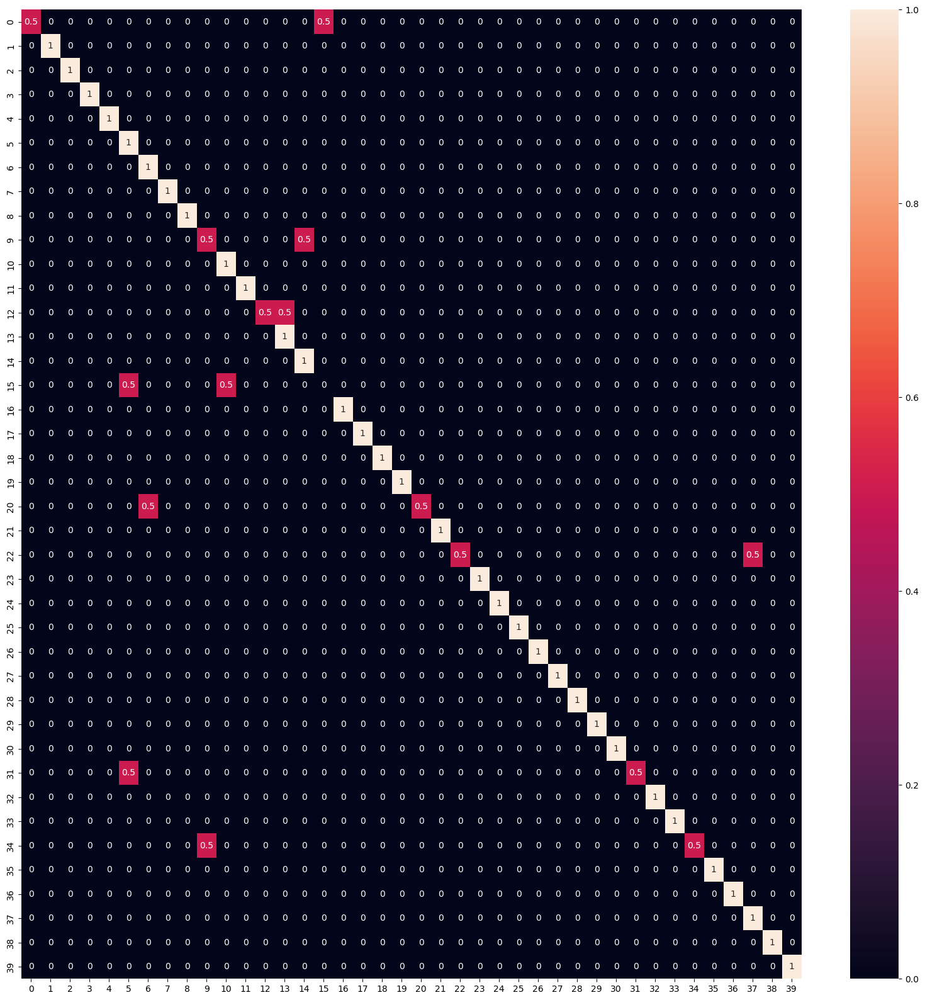

c:\Users\alime\anaconda3\Lib\site-packages\skimage\feature\texture.py:353: UserWarning: Applying `local_binary_pattern` to floating-point images may give unexpected results when small numerical differences between adjacent pixels are present. It is recommended to use this function with images of integer dtype.
  warnings.warn(


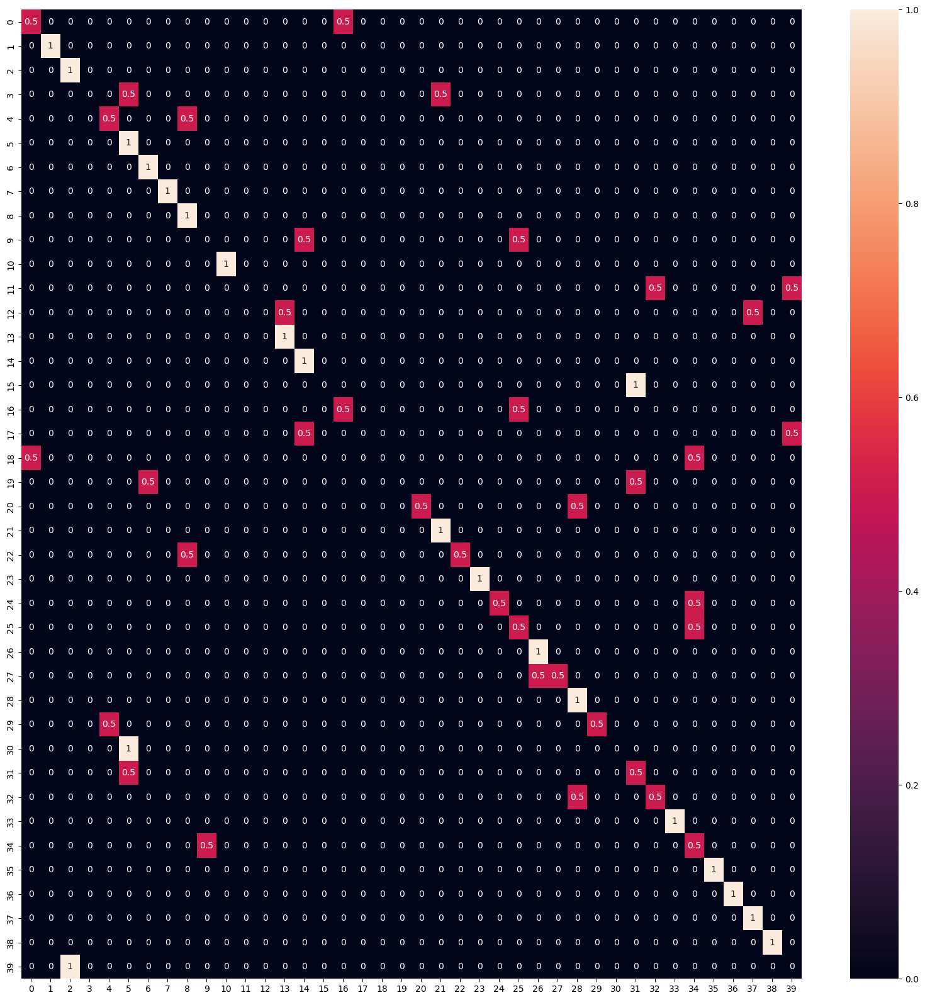

In [172]:
generate_confusion_matrix(prediction_svm_1)
generate_confusion_matrix(prediction_svm_2)
generate_confusion_matrix(prediction_svm_3)
generate_confusion_matrix(prediction_svm_4)
generate_confusion_matrix(prediction_svm_5)
generate_confusion_matrix(prediction_svm_6)
generate_confusion_matrix(prediction_svm_7)

# Multi-layer perceptron classification

In [175]:
def MLP_model(h1, h2, h3, LR, activation_func):

    train_paths = [f'train_dataset_{i+1}\\**\\*.pgm' for i in range(5)]
    test_paths = [f'test_dataset_{i+1}\\**\\*.pgm' for i in range(5)]

    accuracies = []

    prediction_mlp_ret = 0
    probability_matrix_mlp = 0
    max_accuracy = 0

    for i in range(5):
        train_data, train_label = get_data(train_paths[i], 12, 8, 'ror', 1310)
        test_data, test_label = get_data(test_paths[i], 12, 8, 'ror', 1310)

        mlp = MLPClassifier(hidden_layer_sizes=(h1, h2, h3), learning_rate_init= LR, random_state= 1, max_iter = 200, activation= activation_func)
        mlp.fit(train_data, train_label)

        # probability matrix NxM where N is number of samples and M is the number of classes
        probability_matrix_mlp = mlp.predict_proba(test_data)

        # Make prediction
        prediction_mlp = mlp.predict(test_data)

        # Calculate accuracy
        accuracy_mlp = mlp.score(test_data, test_label)

        if accuracy_mlp > max_accuracy:
            max_accuracy = accuracy_mlp
            probability_matrix_mlp = probability_matrix_mlp
            prediction_mlp_ret = prediction_mlp

        accuracies.append(accuracy_mlp)

        print('mlp accuracy fold {}: {:.2f}%'.format(i+1, accuracy_mlp * 100))

    print('Average accuracy: {:.2f}%'.format(np.mean(accuracies) * 100))

    plot_predictions(prediction_mlp_ret)

    return probability_matrix_mlp, prediction_mlp

### MLP layers = 128,64,128, Learing_rate = 0.001, activation_function = 'relu'

c:\Users\alime\anaconda3\Lib\site-packages\skimage\feature\texture.py:353: UserWarning: Applying `local_binary_pattern` to floating-point images may give unexpected results when small numerical differences between adjacent pixels are present. It is recommended to use this function with images of integer dtype.
  warnings.warn(
c:\Users\alime\anaconda3\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:691: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
c:\Users\alime\anaconda3\Lib\site-packages\skimage\feature\texture.py:353: UserWarning: Applying `local_binary_pattern` to floating-point images may give unexpected results when small numerical differences between adjacent pixels are present. It is recommended to use this function with images of integer dtype.
  warnings.warn(


mlp accuracy fold 1: 85.00%


c:\Users\alime\anaconda3\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:691: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
c:\Users\alime\anaconda3\Lib\site-packages\skimage\feature\texture.py:353: UserWarning: Applying `local_binary_pattern` to floating-point images may give unexpected results when small numerical differences between adjacent pixels are present. It is recommended to use this function with images of integer dtype.
  warnings.warn(


mlp accuracy fold 2: 76.25%


c:\Users\alime\anaconda3\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:691: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
c:\Users\alime\anaconda3\Lib\site-packages\skimage\feature\texture.py:353: UserWarning: Applying `local_binary_pattern` to floating-point images may give unexpected results when small numerical differences between adjacent pixels are present. It is recommended to use this function with images of integer dtype.
  warnings.warn(


mlp accuracy fold 3: 77.50%


c:\Users\alime\anaconda3\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:691: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
c:\Users\alime\anaconda3\Lib\site-packages\skimage\feature\texture.py:353: UserWarning: Applying `local_binary_pattern` to floating-point images may give unexpected results when small numerical differences between adjacent pixels are present. It is recommended to use this function with images of integer dtype.
  warnings.warn(


mlp accuracy fold 4: 65.00%


c:\Users\alime\anaconda3\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:691: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
c:\Users\alime\anaconda3\Lib\site-packages\skimage\feature\texture.py:353: UserWarning: Applying `local_binary_pattern` to floating-point images may give unexpected results when small numerical differences between adjacent pixels are present. It is recommended to use this function with images of integer dtype.
  warnings.warn(


mlp accuracy fold 5: 65.00%
Average accuracy: 73.75%


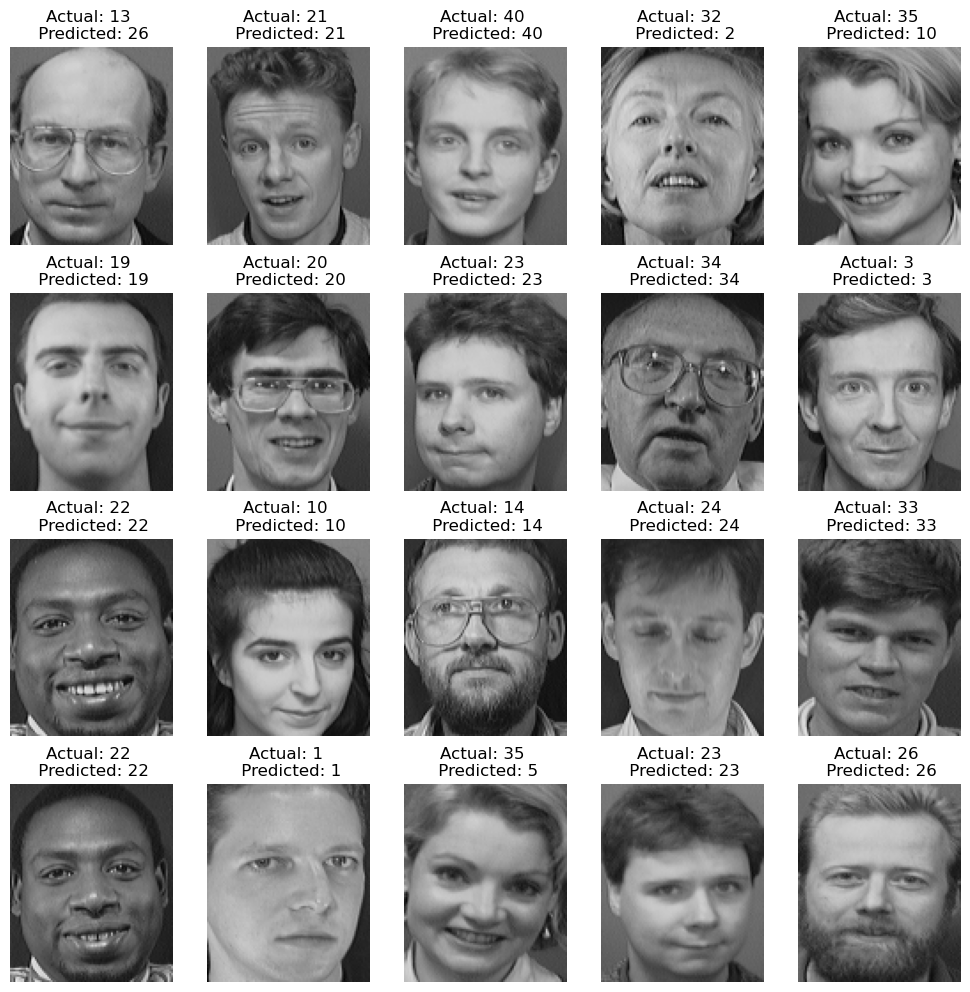

In [176]:
probability_matrix_mlp_1, prediction_mlp_1 =  MLP_model(128, 64, 128, 0.001, 'relu')


### MLP layers = 128,64,128, Learing_rate = 0.0001, activation_function = 'relu'

c:\Users\alime\anaconda3\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:691: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
c:\Users\alime\anaconda3\Lib\site-packages\skimage\feature\texture.py:353: UserWarning: Applying `local_binary_pattern` to floating-point images may give unexpected results when small numerical differences between adjacent pixels are present. It is recommended to use this function with images of integer dtype.
  warnings.warn(


mlp accuracy fold 1: 51.25%


c:\Users\alime\anaconda3\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:691: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
c:\Users\alime\anaconda3\Lib\site-packages\skimage\feature\texture.py:353: UserWarning: Applying `local_binary_pattern` to floating-point images may give unexpected results when small numerical differences between adjacent pixels are present. It is recommended to use this function with images of integer dtype.
  warnings.warn(


mlp accuracy fold 2: 41.25%


c:\Users\alime\anaconda3\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:691: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
c:\Users\alime\anaconda3\Lib\site-packages\skimage\feature\texture.py:353: UserWarning: Applying `local_binary_pattern` to floating-point images may give unexpected results when small numerical differences between adjacent pixels are present. It is recommended to use this function with images of integer dtype.
  warnings.warn(


mlp accuracy fold 3: 43.75%


c:\Users\alime\anaconda3\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:691: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
c:\Users\alime\anaconda3\Lib\site-packages\skimage\feature\texture.py:353: UserWarning: Applying `local_binary_pattern` to floating-point images may give unexpected results when small numerical differences between adjacent pixels are present. It is recommended to use this function with images of integer dtype.
  warnings.warn(


mlp accuracy fold 4: 48.75%


c:\Users\alime\anaconda3\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:691: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
c:\Users\alime\anaconda3\Lib\site-packages\skimage\feature\texture.py:353: UserWarning: Applying `local_binary_pattern` to floating-point images may give unexpected results when small numerical differences between adjacent pixels are present. It is recommended to use this function with images of integer dtype.
  warnings.warn(


mlp accuracy fold 5: 45.00%
Average accuracy: 46.00%


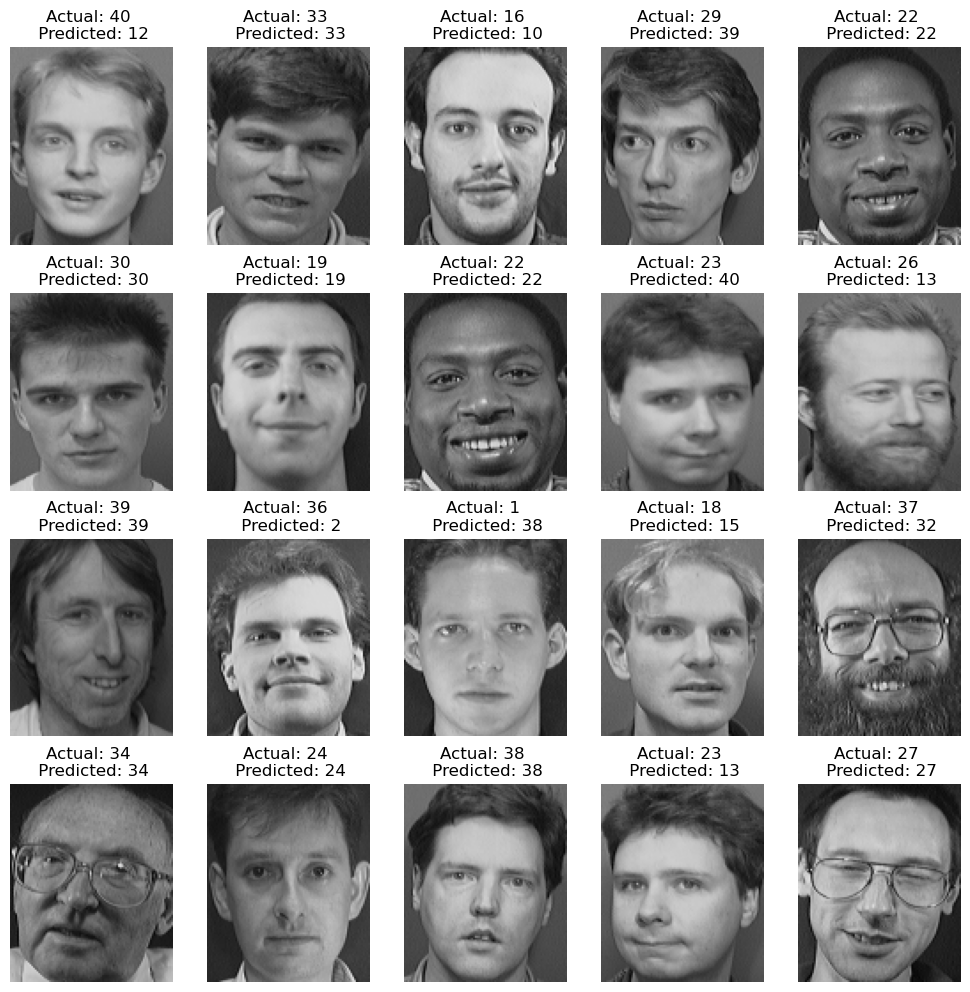

In [180]:
probability_matrix_mlp_2, prediction_mlp_2 =  MLP_model(128, 64, 128, 0.0001, 'relu')

### MLP layers = 128,64,128, Learing_rate = 0.01, activation_function = 'relu'

mlp accuracy fold 1: 43.75%


c:\Users\alime\anaconda3\Lib\site-packages\skimage\feature\texture.py:353: UserWarning: Applying `local_binary_pattern` to floating-point images may give unexpected results when small numerical differences between adjacent pixels are present. It is recommended to use this function with images of integer dtype.
  warnings.warn(


mlp accuracy fold 2: 43.75%


c:\Users\alime\anaconda3\Lib\site-packages\skimage\feature\texture.py:353: UserWarning: Applying `local_binary_pattern` to floating-point images may give unexpected results when small numerical differences between adjacent pixels are present. It is recommended to use this function with images of integer dtype.
  warnings.warn(


mlp accuracy fold 3: 27.50%


c:\Users\alime\anaconda3\Lib\site-packages\skimage\feature\texture.py:353: UserWarning: Applying `local_binary_pattern` to floating-point images may give unexpected results when small numerical differences between adjacent pixels are present. It is recommended to use this function with images of integer dtype.
  warnings.warn(


mlp accuracy fold 4: 46.25%


c:\Users\alime\anaconda3\Lib\site-packages\skimage\feature\texture.py:353: UserWarning: Applying `local_binary_pattern` to floating-point images may give unexpected results when small numerical differences between adjacent pixels are present. It is recommended to use this function with images of integer dtype.
  warnings.warn(


mlp accuracy fold 5: 23.75%
Average accuracy: 37.00%


c:\Users\alime\anaconda3\Lib\site-packages\skimage\feature\texture.py:353: UserWarning: Applying `local_binary_pattern` to floating-point images may give unexpected results when small numerical differences between adjacent pixels are present. It is recommended to use this function with images of integer dtype.
  warnings.warn(


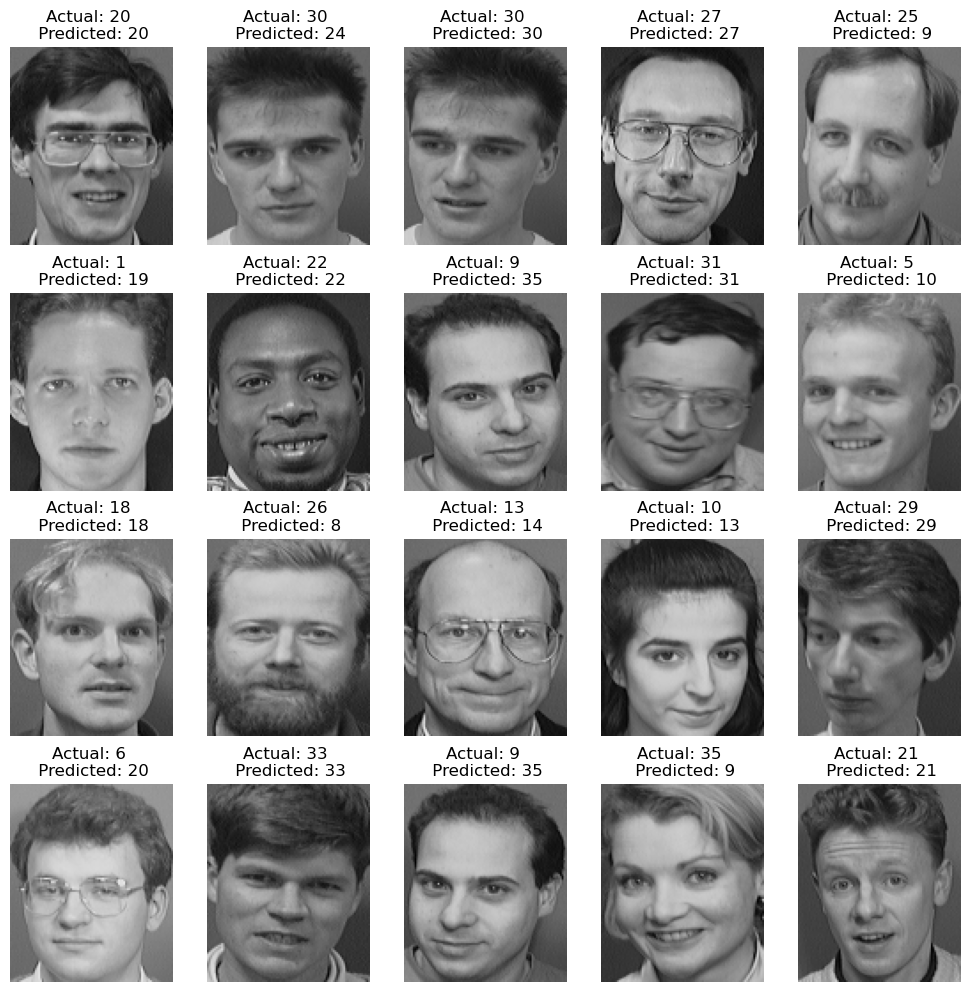

In [181]:
probability_matrix_mlp_3, prediction_mlp_3 =  MLP_model(128, 64, 128, 0.01, 'relu')

### MLP layers = 256,128,256, Learing_rate = 0.001, activation_function = 'relu'

mlp accuracy fold 1: 90.00%


c:\Users\alime\anaconda3\Lib\site-packages\skimage\feature\texture.py:353: UserWarning: Applying `local_binary_pattern` to floating-point images may give unexpected results when small numerical differences between adjacent pixels are present. It is recommended to use this function with images of integer dtype.
  warnings.warn(


mlp accuracy fold 2: 83.75%


c:\Users\alime\anaconda3\Lib\site-packages\skimage\feature\texture.py:353: UserWarning: Applying `local_binary_pattern` to floating-point images may give unexpected results when small numerical differences between adjacent pixels are present. It is recommended to use this function with images of integer dtype.
  warnings.warn(


mlp accuracy fold 3: 82.50%


c:\Users\alime\anaconda3\Lib\site-packages\skimage\feature\texture.py:353: UserWarning: Applying `local_binary_pattern` to floating-point images may give unexpected results when small numerical differences between adjacent pixels are present. It is recommended to use this function with images of integer dtype.
  warnings.warn(


mlp accuracy fold 4: 80.00%


c:\Users\alime\anaconda3\Lib\site-packages\skimage\feature\texture.py:353: UserWarning: Applying `local_binary_pattern` to floating-point images may give unexpected results when small numerical differences between adjacent pixels are present. It is recommended to use this function with images of integer dtype.
  warnings.warn(


mlp accuracy fold 5: 78.75%
Average accuracy: 83.00%


c:\Users\alime\anaconda3\Lib\site-packages\skimage\feature\texture.py:353: UserWarning: Applying `local_binary_pattern` to floating-point images may give unexpected results when small numerical differences between adjacent pixels are present. It is recommended to use this function with images of integer dtype.
  warnings.warn(


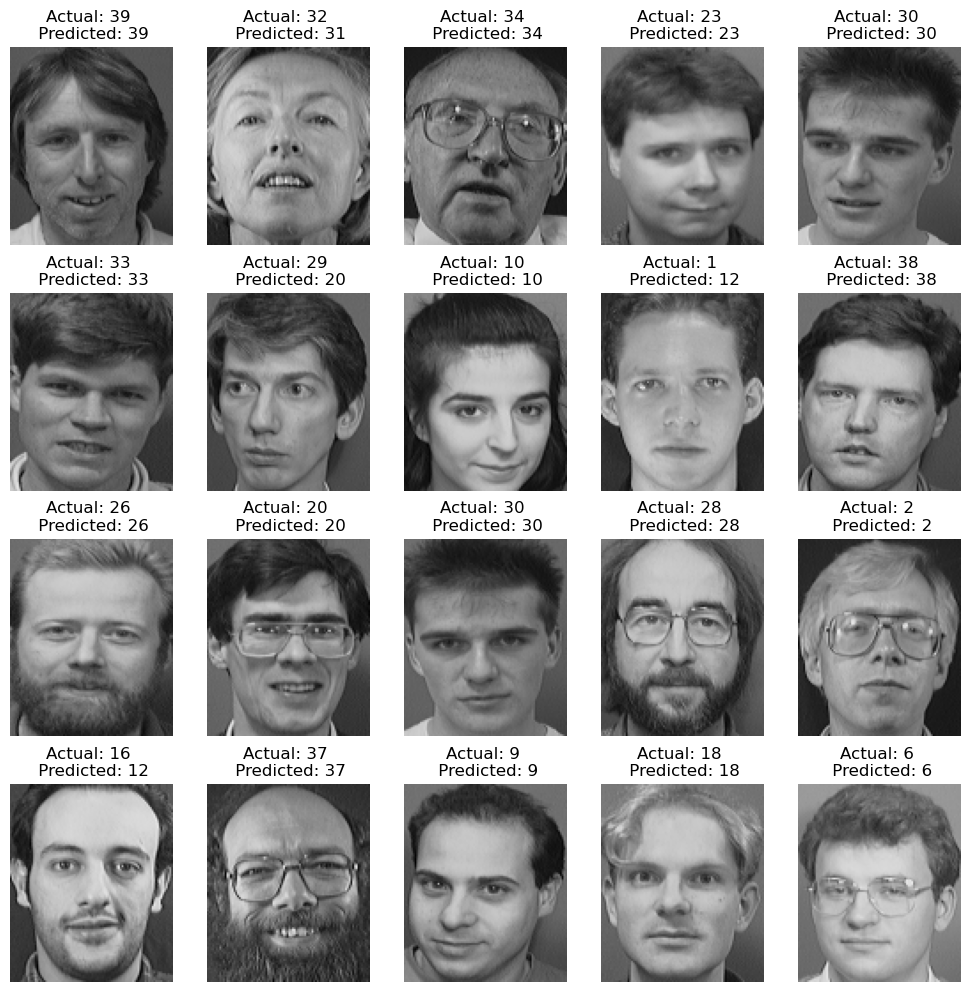

In [182]:
probability_matrix_mlp_4, prediction_mlp_4 =  MLP_model(256, 128, 256, 0.001, 'relu')

### MLP layers = 512,256,512, Learing_rate = 0.001, activation_function = 'relu'

mlp accuracy fold 1: 88.75%


c:\Users\alime\anaconda3\Lib\site-packages\skimage\feature\texture.py:353: UserWarning: Applying `local_binary_pattern` to floating-point images may give unexpected results when small numerical differences between adjacent pixels are present. It is recommended to use this function with images of integer dtype.
  warnings.warn(


mlp accuracy fold 2: 81.25%


c:\Users\alime\anaconda3\Lib\site-packages\skimage\feature\texture.py:353: UserWarning: Applying `local_binary_pattern` to floating-point images may give unexpected results when small numerical differences between adjacent pixels are present. It is recommended to use this function with images of integer dtype.
  warnings.warn(


mlp accuracy fold 3: 80.00%


c:\Users\alime\anaconda3\Lib\site-packages\skimage\feature\texture.py:353: UserWarning: Applying `local_binary_pattern` to floating-point images may give unexpected results when small numerical differences between adjacent pixels are present. It is recommended to use this function with images of integer dtype.
  warnings.warn(


mlp accuracy fold 4: 78.75%


c:\Users\alime\anaconda3\Lib\site-packages\skimage\feature\texture.py:353: UserWarning: Applying `local_binary_pattern` to floating-point images may give unexpected results when small numerical differences between adjacent pixels are present. It is recommended to use this function with images of integer dtype.
  warnings.warn(


mlp accuracy fold 5: 85.00%
Average accuracy: 82.75%


c:\Users\alime\anaconda3\Lib\site-packages\skimage\feature\texture.py:353: UserWarning: Applying `local_binary_pattern` to floating-point images may give unexpected results when small numerical differences between adjacent pixels are present. It is recommended to use this function with images of integer dtype.
  warnings.warn(


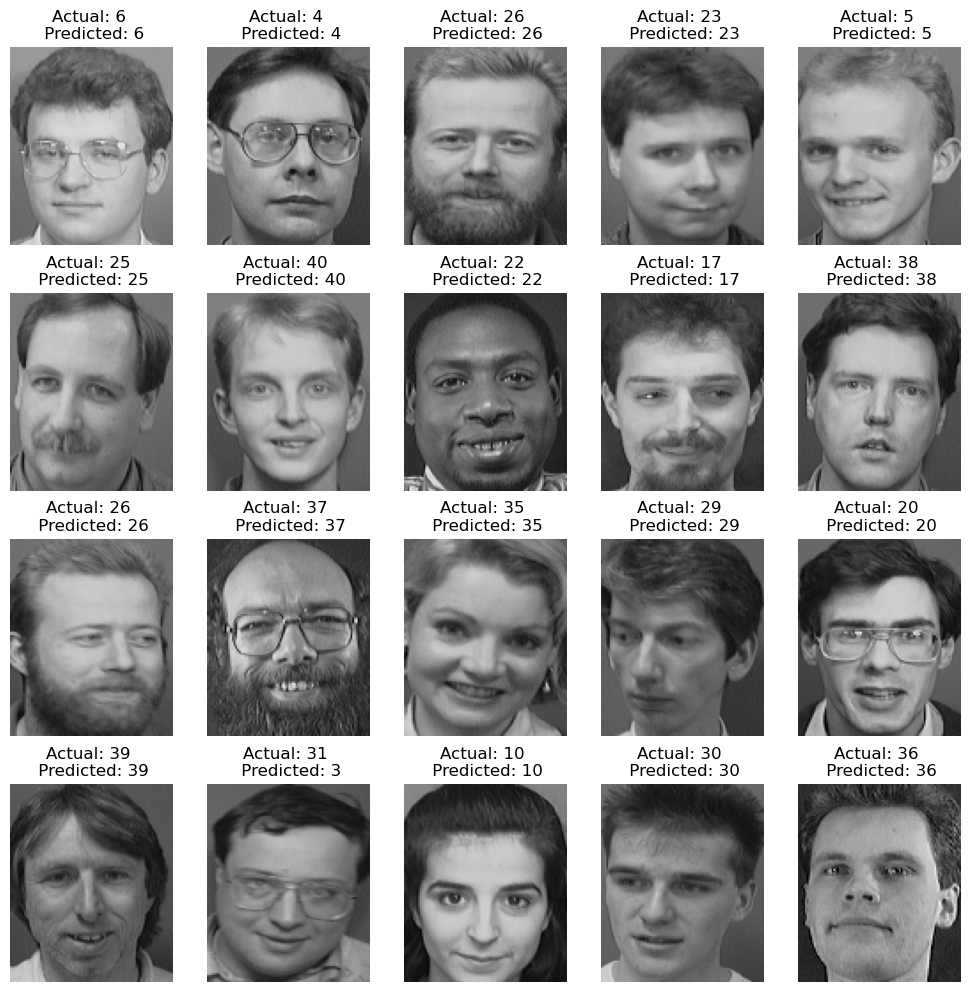

In [183]:
probability_matrix_mlp_5, prediction_mlp_5 =  MLP_model(512, 256, 512, 0.001, 'relu')

### MLP layers = 1024,512,1024, Learing_rate = 0.001, activation_function = 'relu'

mlp accuracy fold 1: 87.50%


c:\Users\alime\anaconda3\Lib\site-packages\skimage\feature\texture.py:353: UserWarning: Applying `local_binary_pattern` to floating-point images may give unexpected results when small numerical differences between adjacent pixels are present. It is recommended to use this function with images of integer dtype.
  warnings.warn(


mlp accuracy fold 2: 82.50%


c:\Users\alime\anaconda3\Lib\site-packages\skimage\feature\texture.py:353: UserWarning: Applying `local_binary_pattern` to floating-point images may give unexpected results when small numerical differences between adjacent pixels are present. It is recommended to use this function with images of integer dtype.
  warnings.warn(


mlp accuracy fold 3: 85.00%


c:\Users\alime\anaconda3\Lib\site-packages\skimage\feature\texture.py:353: UserWarning: Applying `local_binary_pattern` to floating-point images may give unexpected results when small numerical differences between adjacent pixels are present. It is recommended to use this function with images of integer dtype.
  warnings.warn(


mlp accuracy fold 4: 82.50%


c:\Users\alime\anaconda3\Lib\site-packages\skimage\feature\texture.py:353: UserWarning: Applying `local_binary_pattern` to floating-point images may give unexpected results when small numerical differences between adjacent pixels are present. It is recommended to use this function with images of integer dtype.
  warnings.warn(


mlp accuracy fold 5: 82.50%
Average accuracy: 84.00%


c:\Users\alime\anaconda3\Lib\site-packages\skimage\feature\texture.py:353: UserWarning: Applying `local_binary_pattern` to floating-point images may give unexpected results when small numerical differences between adjacent pixels are present. It is recommended to use this function with images of integer dtype.
  warnings.warn(


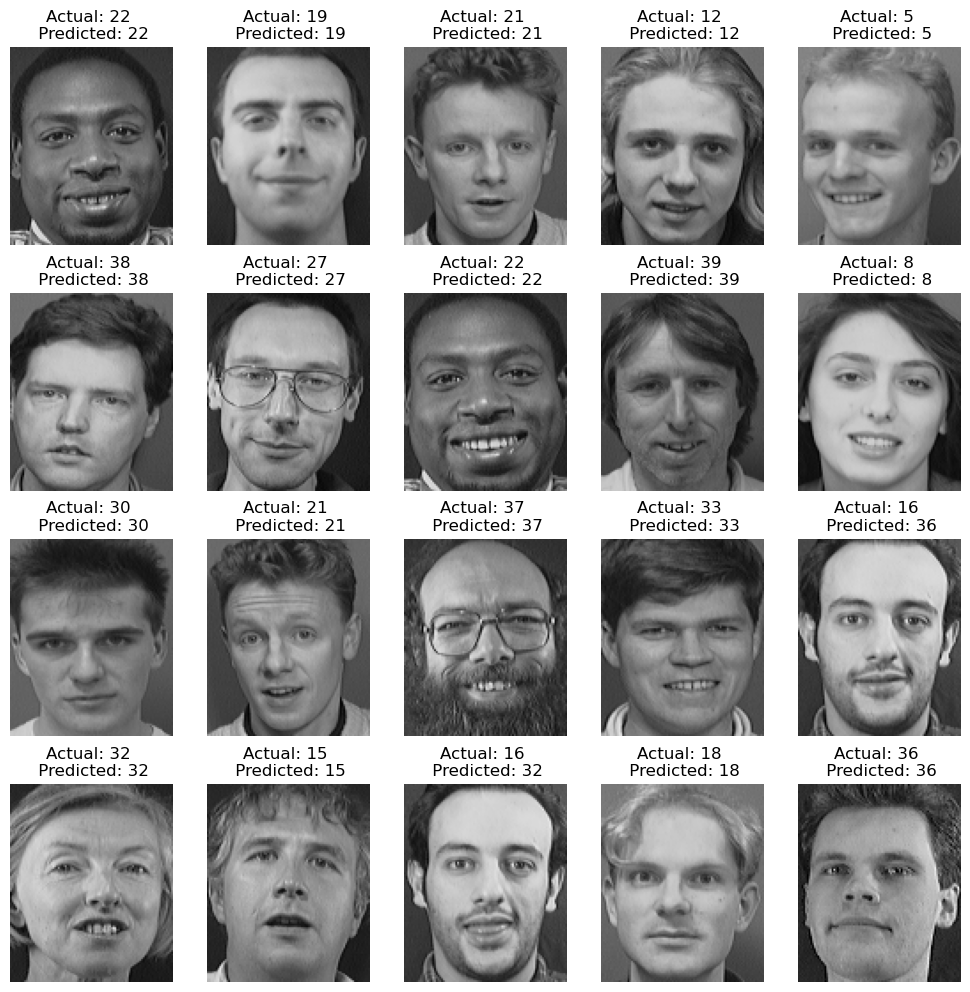

In [184]:
probability_matrix_mlp_6, prediction_mlp_6 =  MLP_model(1024, 512, 1024, 0.001, 'relu')

### MLP layers = 1024,512,1024, Learing_rate = 0.001, activation_function = 'tanh'

mlp accuracy fold 1: 88.75%


c:\Users\alime\anaconda3\Lib\site-packages\skimage\feature\texture.py:353: UserWarning: Applying `local_binary_pattern` to floating-point images may give unexpected results when small numerical differences between adjacent pixels are present. It is recommended to use this function with images of integer dtype.
  warnings.warn(


mlp accuracy fold 2: 81.25%


c:\Users\alime\anaconda3\Lib\site-packages\skimage\feature\texture.py:353: UserWarning: Applying `local_binary_pattern` to floating-point images may give unexpected results when small numerical differences between adjacent pixels are present. It is recommended to use this function with images of integer dtype.
  warnings.warn(


mlp accuracy fold 3: 81.25%


c:\Users\alime\anaconda3\Lib\site-packages\skimage\feature\texture.py:353: UserWarning: Applying `local_binary_pattern` to floating-point images may give unexpected results when small numerical differences between adjacent pixels are present. It is recommended to use this function with images of integer dtype.
  warnings.warn(


mlp accuracy fold 4: 81.25%


c:\Users\alime\anaconda3\Lib\site-packages\skimage\feature\texture.py:353: UserWarning: Applying `local_binary_pattern` to floating-point images may give unexpected results when small numerical differences between adjacent pixels are present. It is recommended to use this function with images of integer dtype.
  warnings.warn(


mlp accuracy fold 5: 81.25%
Average accuracy: 82.75%


c:\Users\alime\anaconda3\Lib\site-packages\skimage\feature\texture.py:353: UserWarning: Applying `local_binary_pattern` to floating-point images may give unexpected results when small numerical differences between adjacent pixels are present. It is recommended to use this function with images of integer dtype.
  warnings.warn(


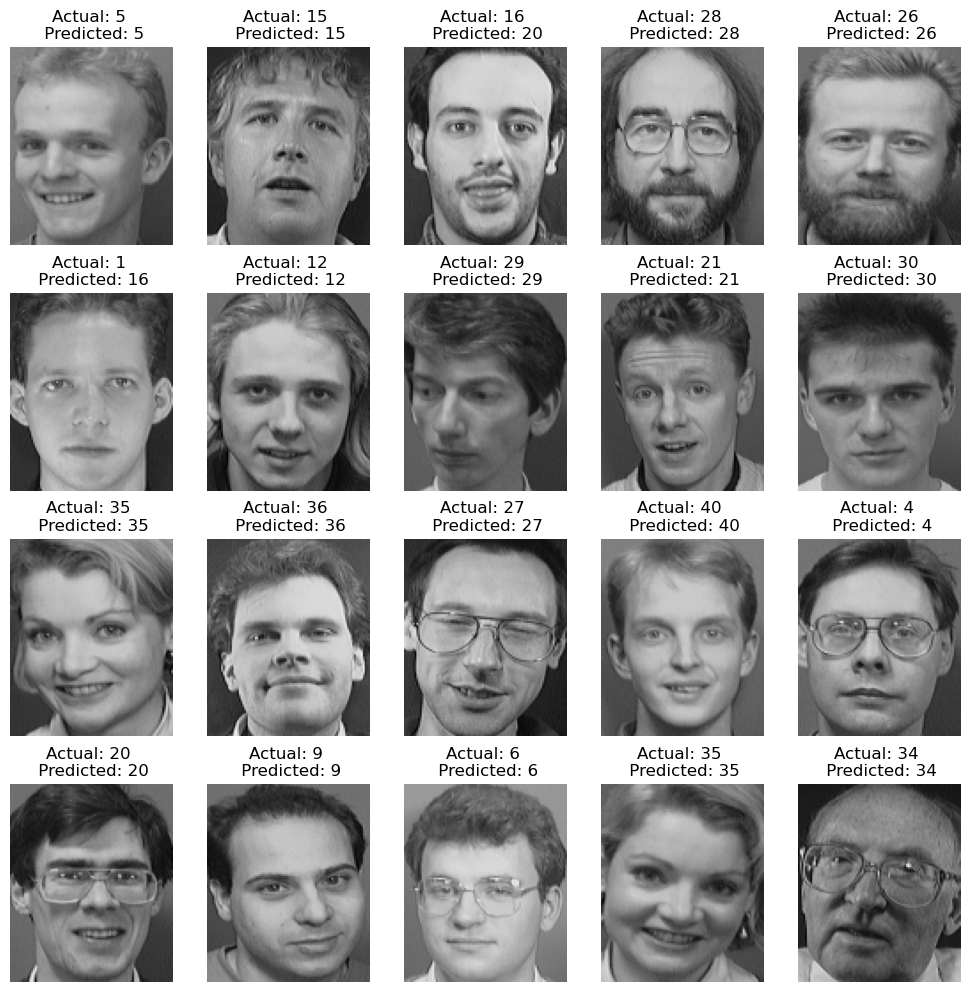

In [186]:
probability_matrix_mlp_7, prediction_mlp_7 =  MLP_model(1024, 512, 1024, 0.001, 'tanh')

### MLP layers = 1024,512,1024, Learing_rate = 0.001, activation_function = 'identity'

mlp accuracy fold 1: 90.00%


c:\Users\alime\anaconda3\Lib\site-packages\skimage\feature\texture.py:353: UserWarning: Applying `local_binary_pattern` to floating-point images may give unexpected results when small numerical differences between adjacent pixels are present. It is recommended to use this function with images of integer dtype.
  warnings.warn(


mlp accuracy fold 2: 75.00%


c:\Users\alime\anaconda3\Lib\site-packages\skimage\feature\texture.py:353: UserWarning: Applying `local_binary_pattern` to floating-point images may give unexpected results when small numerical differences between adjacent pixels are present. It is recommended to use this function with images of integer dtype.
  warnings.warn(


mlp accuracy fold 3: 72.50%


c:\Users\alime\anaconda3\Lib\site-packages\skimage\feature\texture.py:353: UserWarning: Applying `local_binary_pattern` to floating-point images may give unexpected results when small numerical differences between adjacent pixels are present. It is recommended to use this function with images of integer dtype.
  warnings.warn(


mlp accuracy fold 4: 73.75%


c:\Users\alime\anaconda3\Lib\site-packages\skimage\feature\texture.py:353: UserWarning: Applying `local_binary_pattern` to floating-point images may give unexpected results when small numerical differences between adjacent pixels are present. It is recommended to use this function with images of integer dtype.
  warnings.warn(


mlp accuracy fold 5: 82.50%
Average accuracy: 78.75%


c:\Users\alime\anaconda3\Lib\site-packages\skimage\feature\texture.py:353: UserWarning: Applying `local_binary_pattern` to floating-point images may give unexpected results when small numerical differences between adjacent pixels are present. It is recommended to use this function with images of integer dtype.
  warnings.warn(


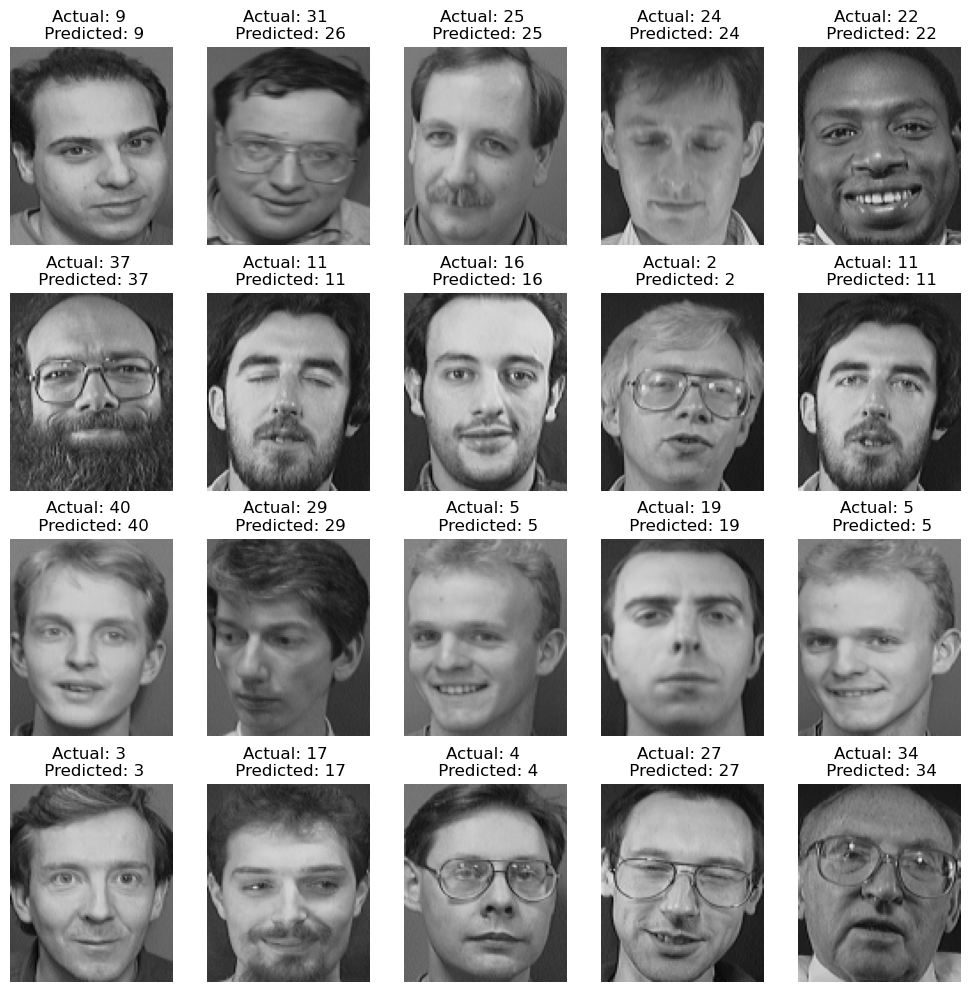

In [187]:
probability_matrix_mlp_8, prediction_mlp_8 =  MLP_model(1024, 512, 1024, 0.001, 'identity')

## ROC and DET curves for MLP

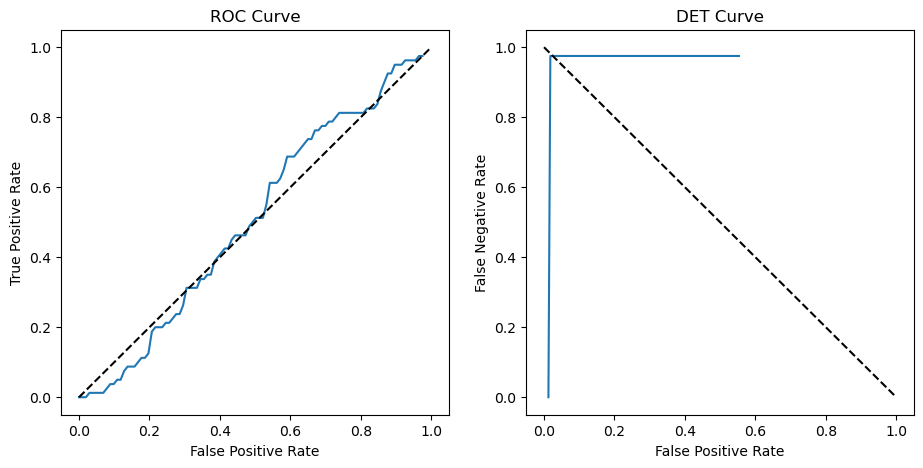

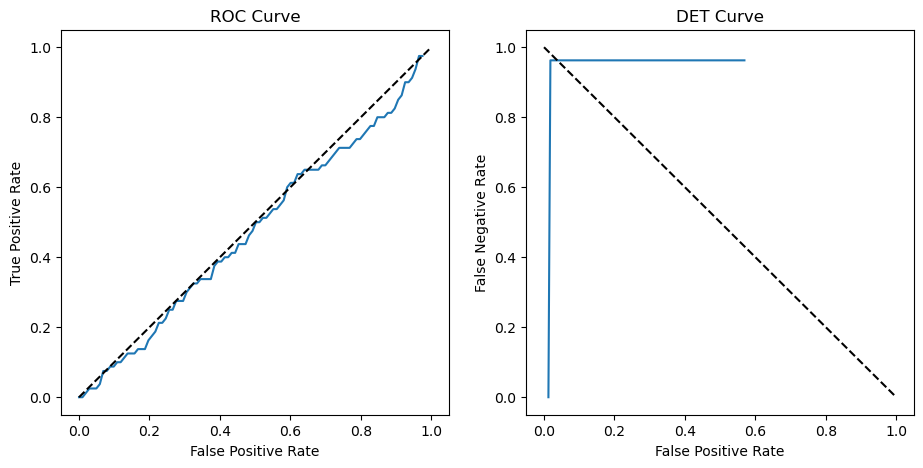

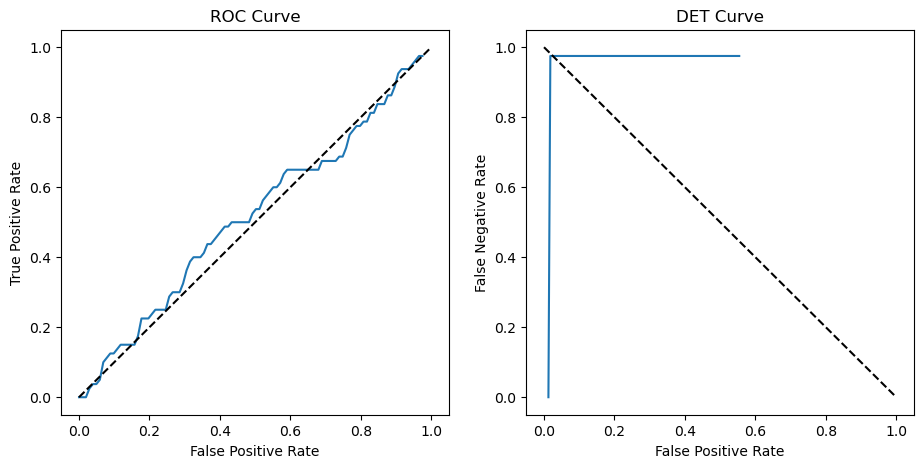

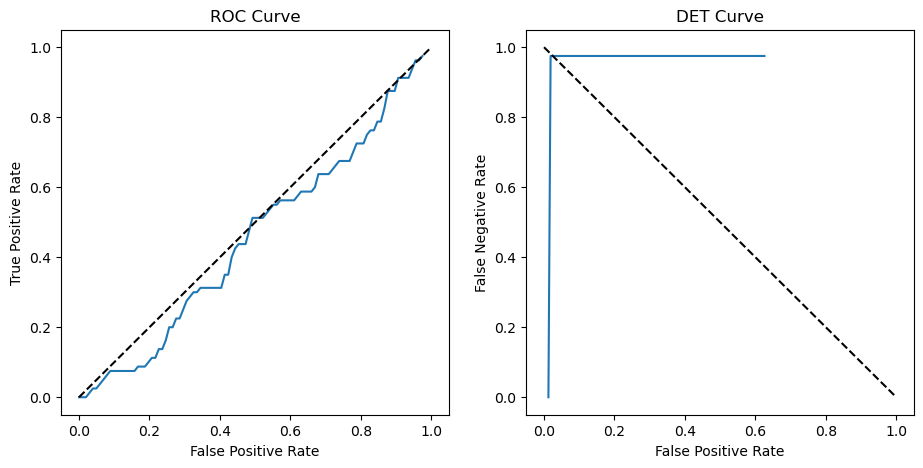

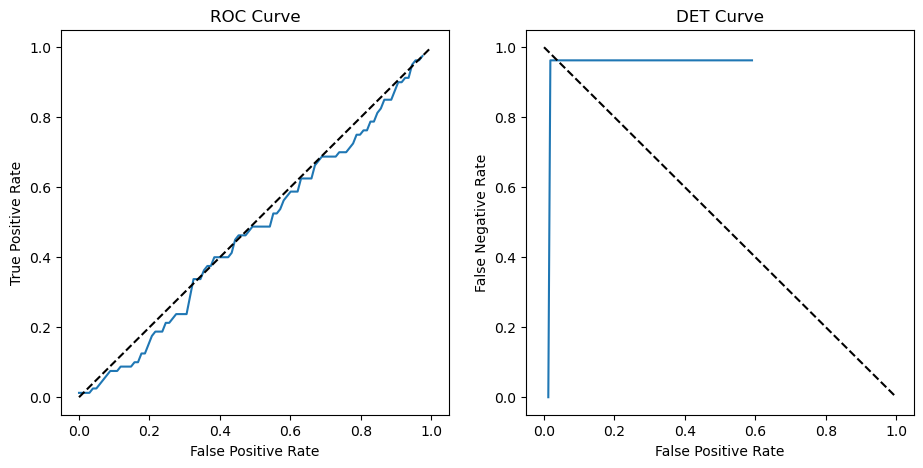

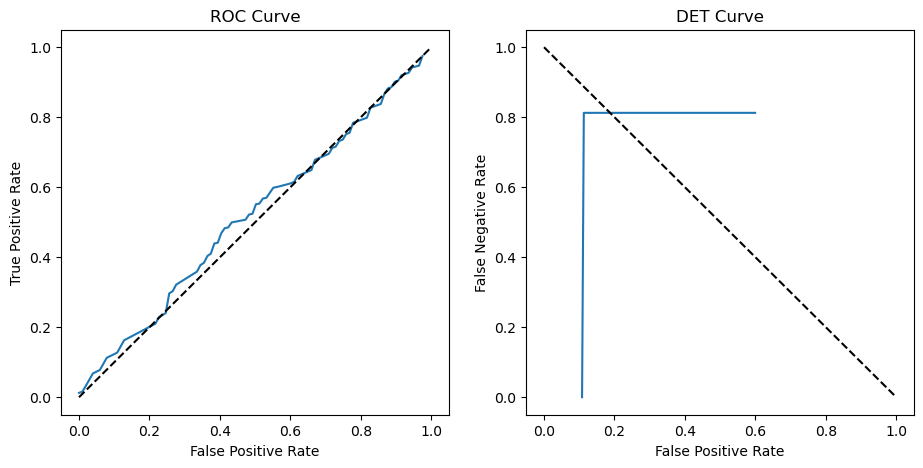

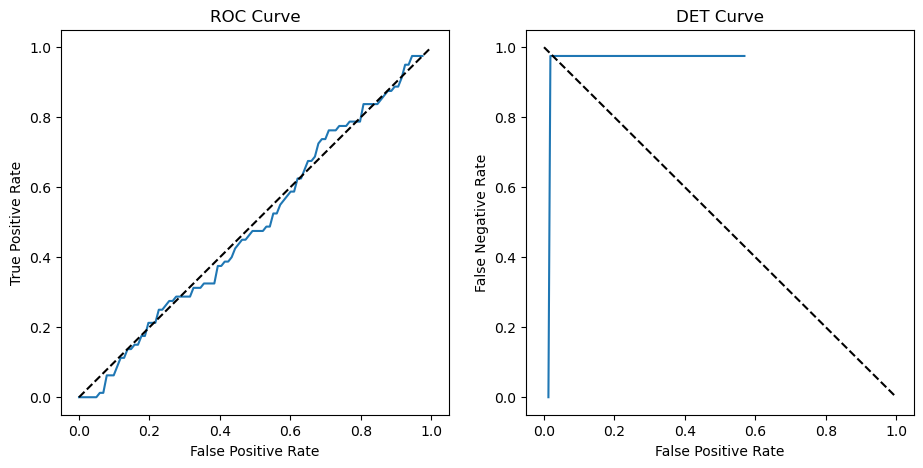

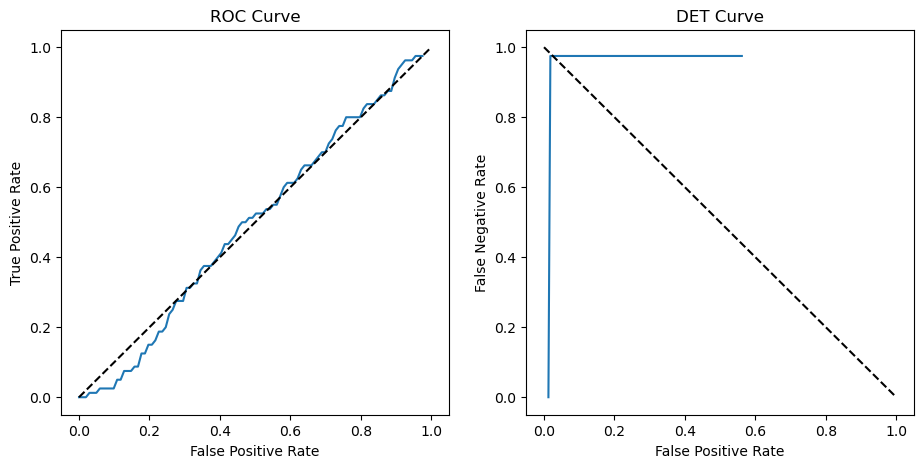

In [317]:
generate_roc_det_curve(probability_matrix_mlp_1)
generate_roc_det_curve(probability_matrix_mlp_2)
generate_roc_det_curve(probability_matrix_mlp_3)
generate_roc_det_curve(probability_matrix_mlp_4)
generate_roc_det_curve(probability_matrix_mlp_5)
generate_roc_det_curve(probability_matrix_mlp_6)
generate_roc_det_curve(probability_matrix_mlp_7)
generate_roc_det_curve(probability_matrix_mlp_8)

## Confusion Matrix for MLP

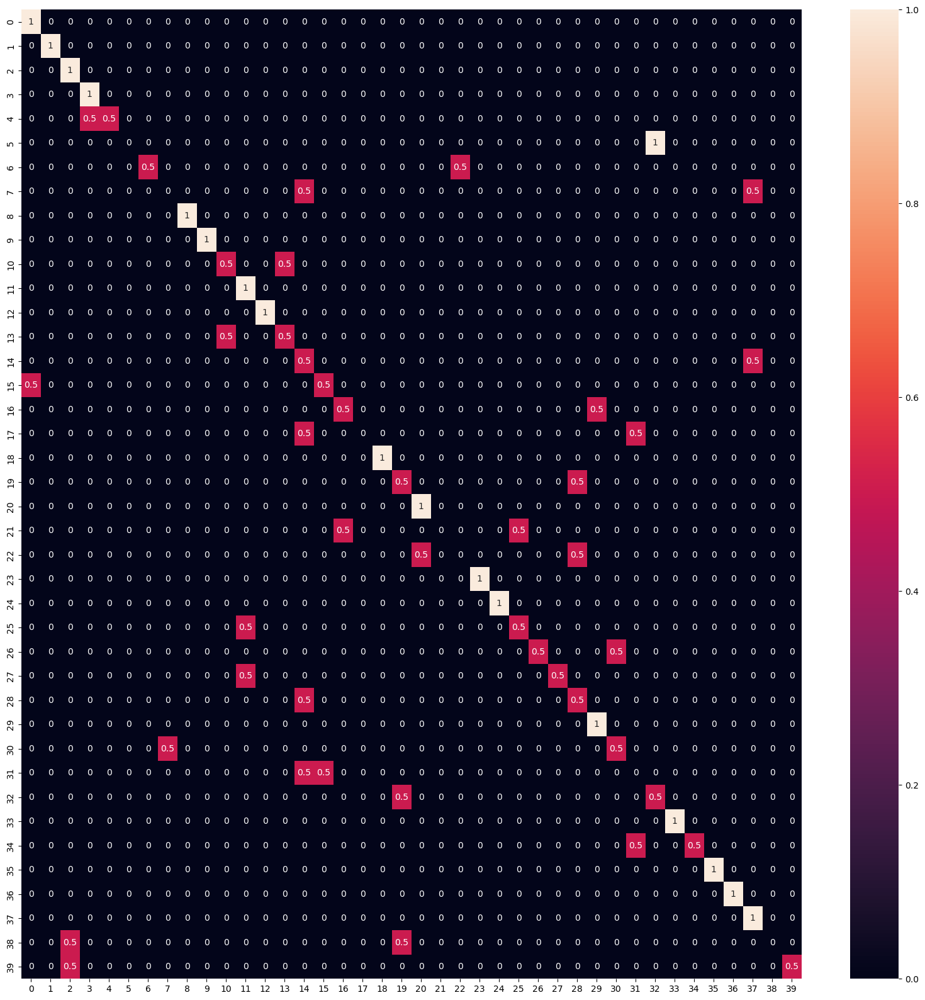

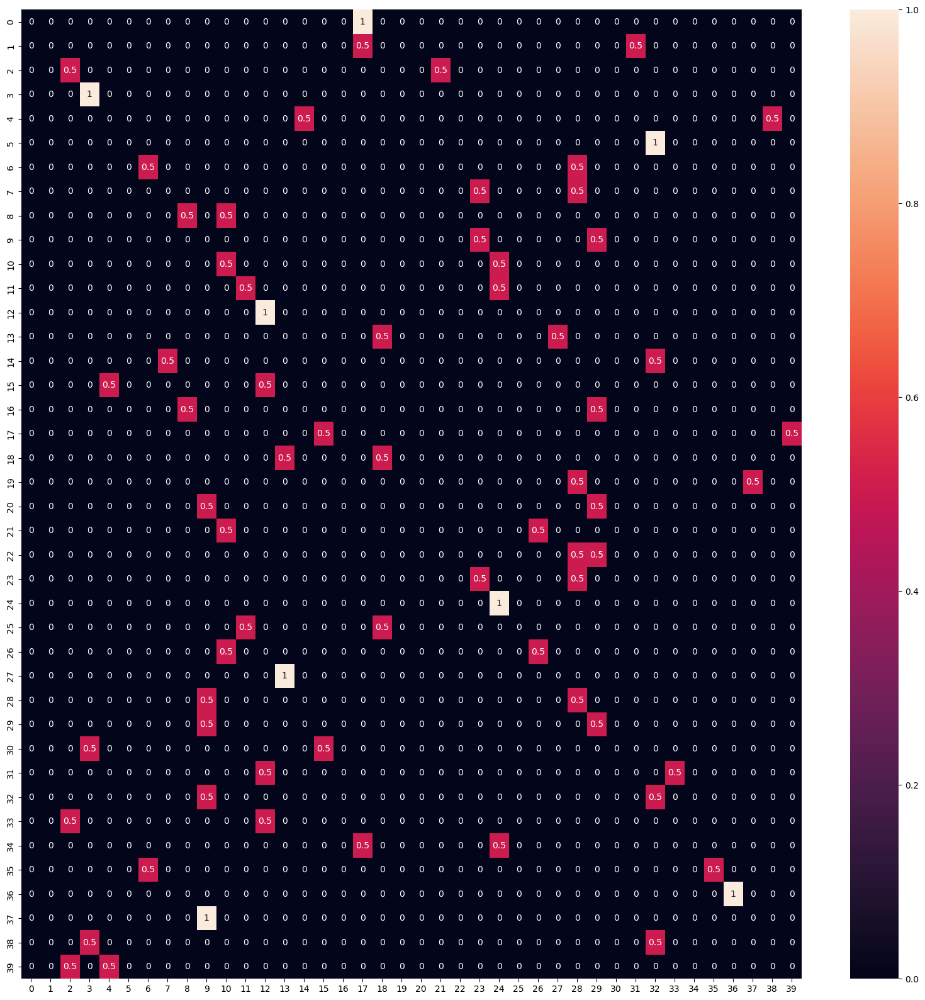

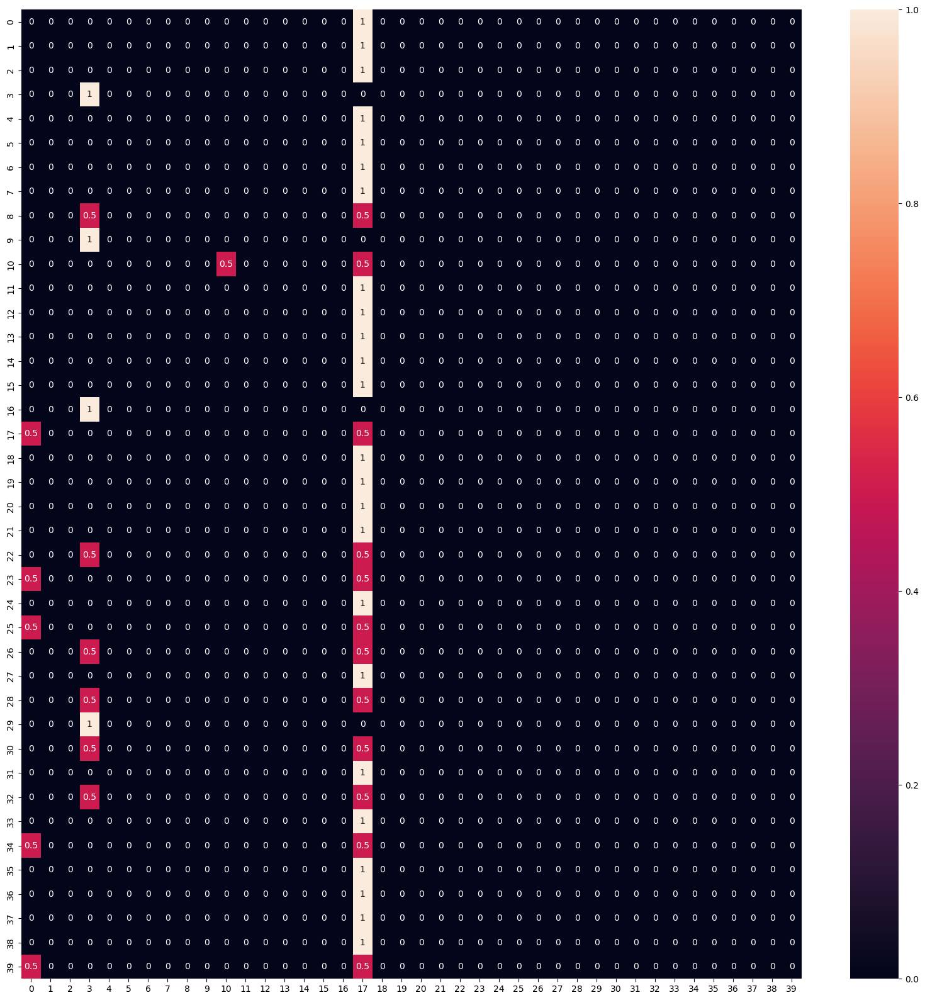

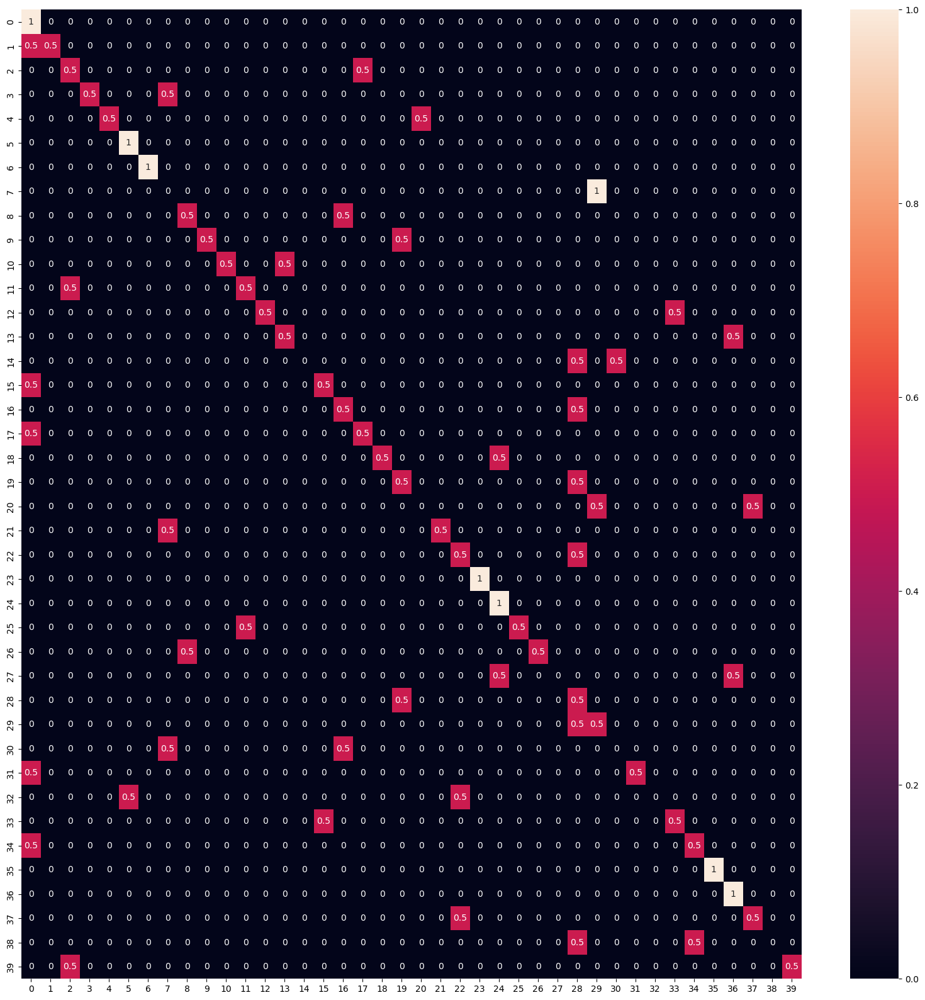

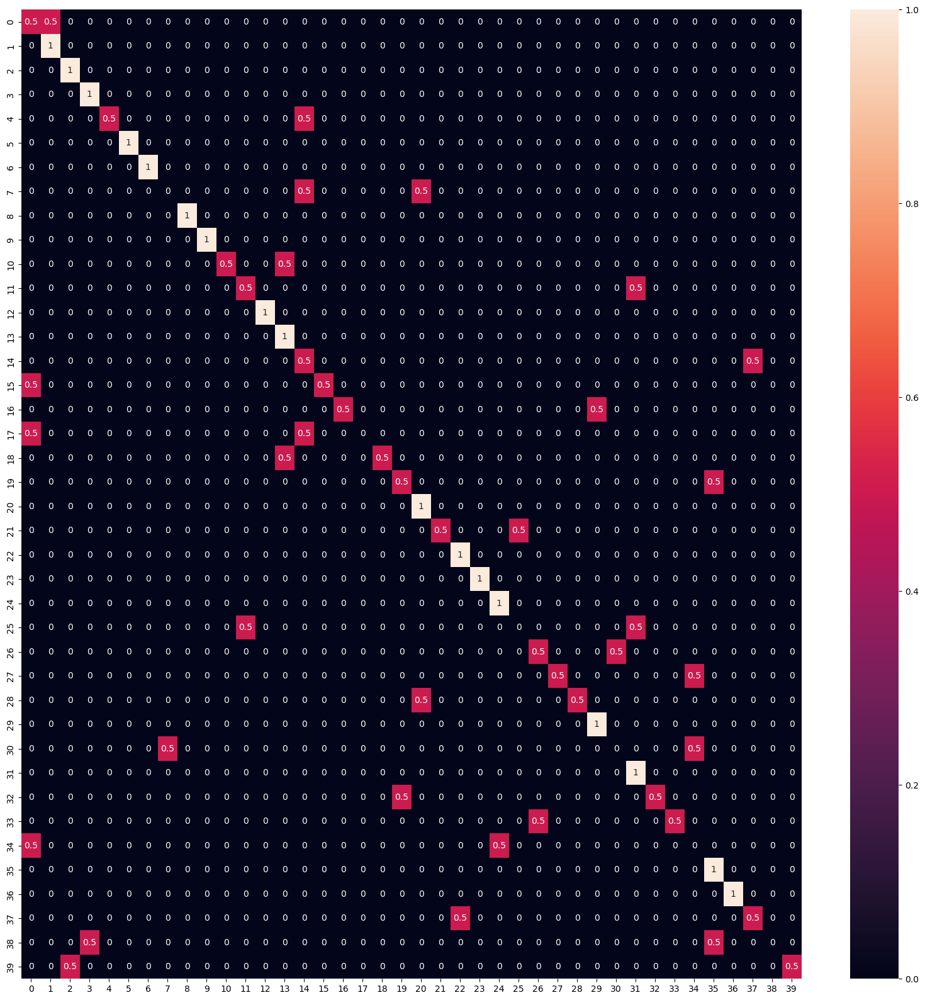

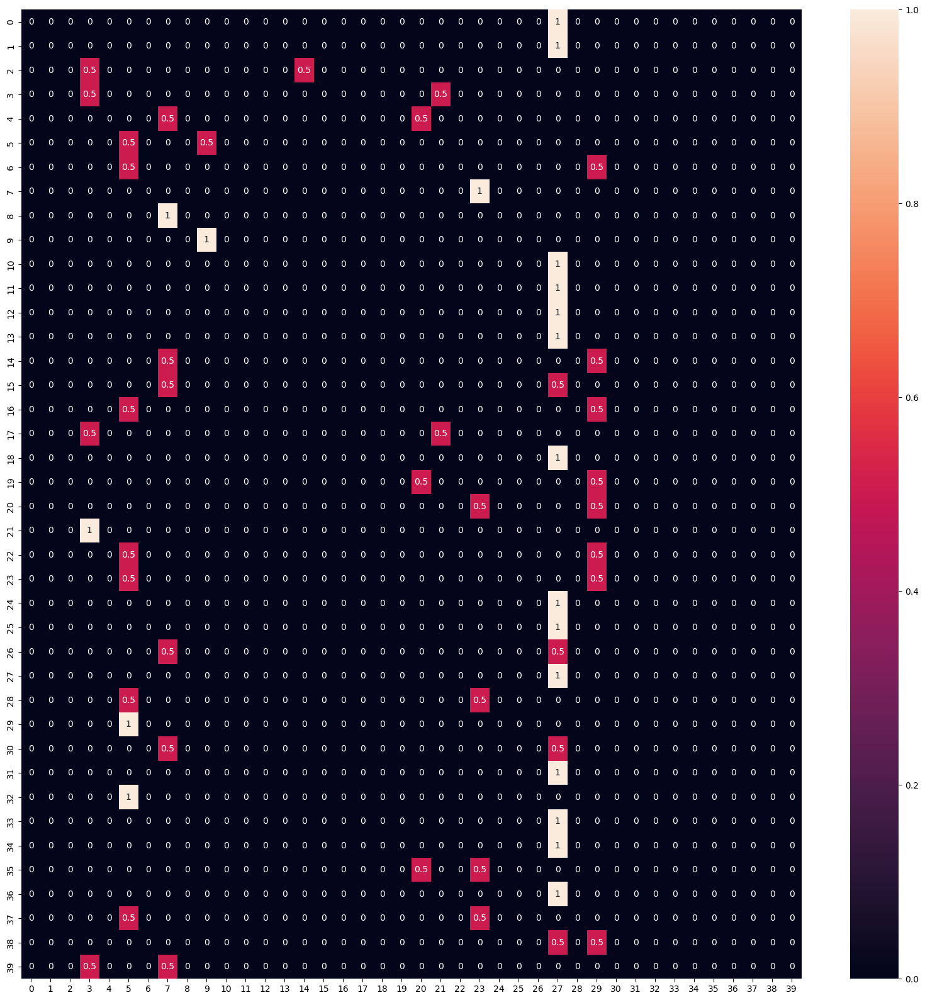

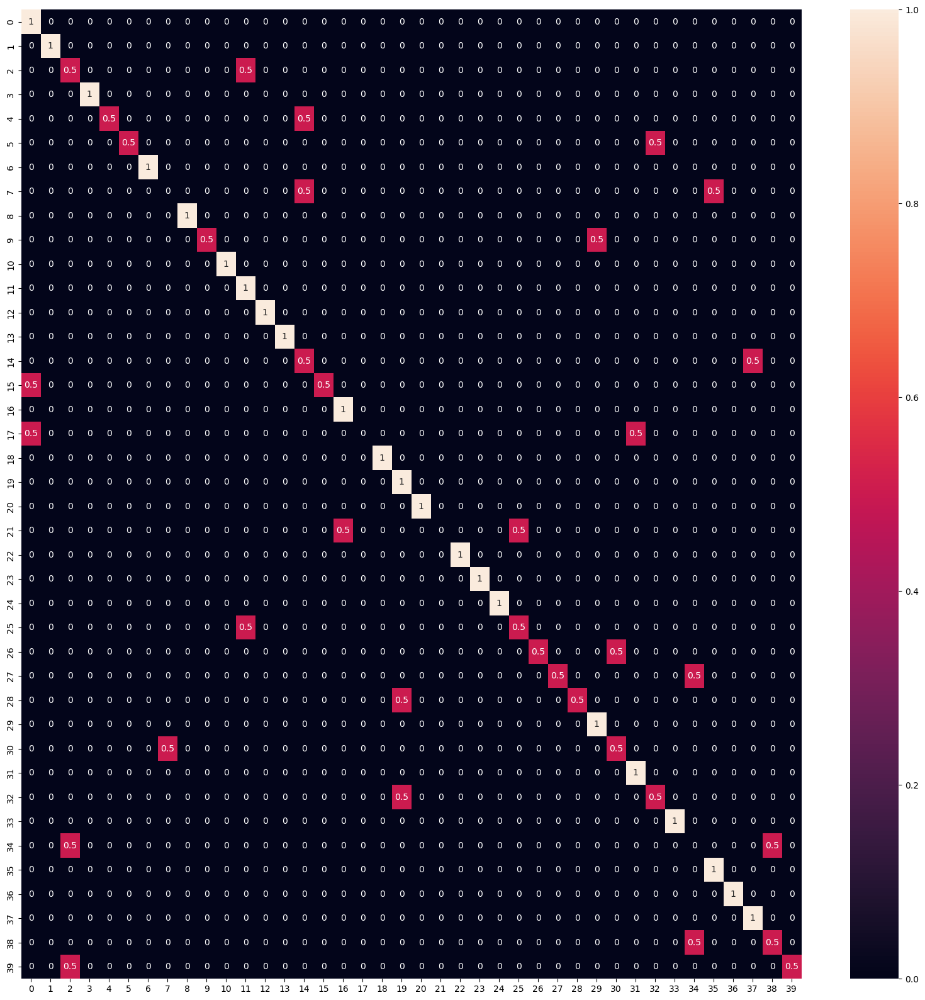

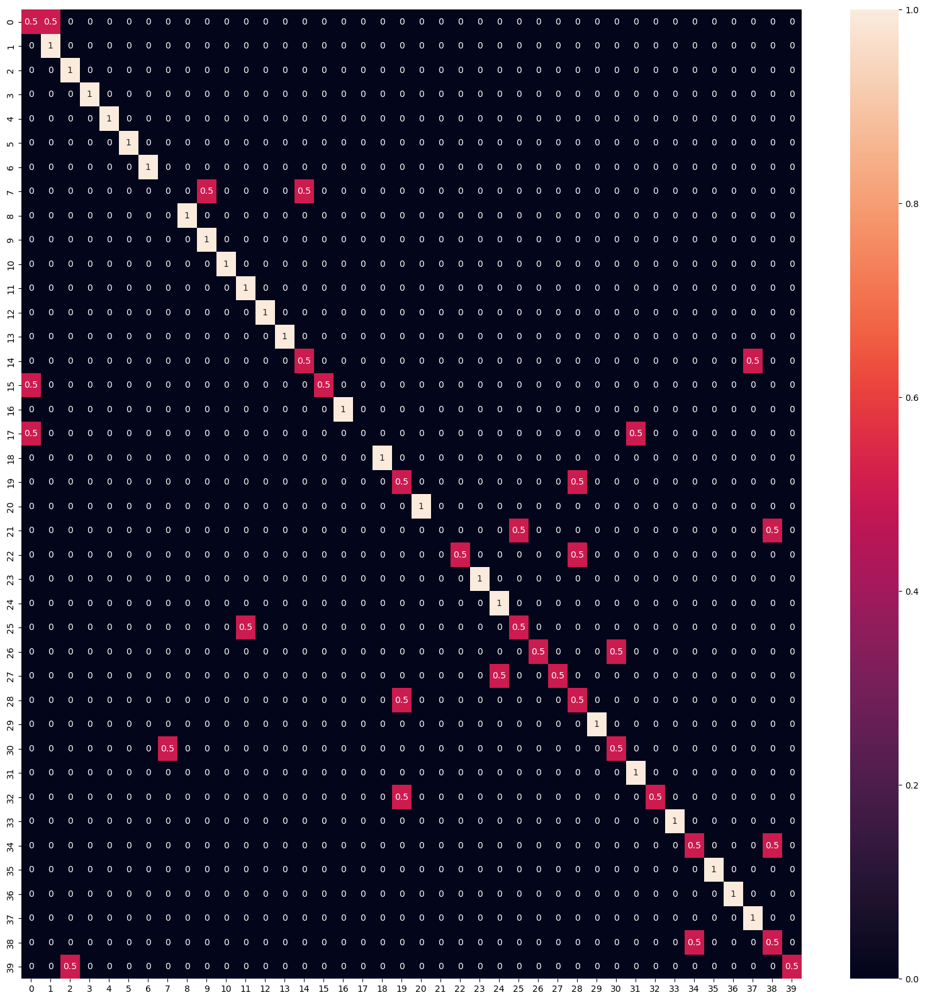

In [318]:
generate_confusion_matrix(prediction_mlp_1)
generate_confusion_matrix(prediction_mlp_2)
generate_confusion_matrix(prediction_mlp_3)
generate_confusion_matrix(prediction_mlp_4)
generate_confusion_matrix(prediction_mlp_5)
generate_confusion_matrix(prediction_mlp_6)
generate_confusion_matrix(prediction_mlp_7)
generate_confusion_matrix(prediction_mlp_8)
